import moduls

In [1]:
import warnings
warnings.filterwarnings('ignore')

import numpy as np
import matplotlib.pyplot as plt
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()
import seaborn as sns
import pandas as pd
import datetime as dt
from datetime import date, time, datetime, timedelta
import plotly.offline as pyo
import plotly.graph_objects as px
import plotly.express as go
pyo.init_notebook_mode()

import folium
from folium import plugins
from folium.plugins import HeatMap

import math

import random

# Color list
import matplotlib.colors as col

### Task 1 Data Collection and Preparation

readin the boston 2016 and weather hourly boston data

In [2]:
boston = pd.read_csv("boston_2016.csv")
weather = pd.read_csv("weather_hourly_boston.csv")

In [3]:
boston.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1236203 entries, 0 to 1236202
Data columns (total 8 columns):
 #   Column              Non-Null Count    Dtype 
---  ------              --------------    ----- 
 0   start_time          1236203 non-null  object
 1   end_time            1236203 non-null  object
 2   start_station_id    1236203 non-null  int64 
 3   end_station_id      1236203 non-null  int64 
 4   start_station_name  1236203 non-null  object
 5   end_station_name    1236203 non-null  object
 6   bike_id             1236203 non-null  int64 
 7   user_type           1236203 non-null  object
dtypes: int64(3), object(5)
memory usage: 75.5+ MB


In [4]:
boston.isna().sum()

start_time            0
end_time              0
start_station_id      0
end_station_id        0
start_station_name    0
end_station_name      0
bike_id               0
user_type             0
dtype: int64

0 null values in boston data
start_time and end_time are object Dtype, but should be datetime

In [5]:
weather.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 43848 entries, 0 to 43847
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   date_time  43354 non-null  object 
 1   max_temp   43354 non-null  float64
 2   min_temp   43354 non-null  float64
 3   precip     43356 non-null  float64
dtypes: float64(3), object(1)
memory usage: 1.3+ MB


In [6]:
weather.isna().sum()

date_time    494
max_temp     494
min_temp     494
precip       492
dtype: int64

### weather data praparation

there are null values in the waether data set
date is object Dtype, but should be datetime

##### Get intuition when NULL values appear and whether there are enough values around them

In [7]:
missing_value_index = [] #creating new list with no values
NaNFrame = weather.isna() #getting DataFrame containing TRUE if NaN is given
num_rows, num_cols = NaNFrame.values.shape #shape returns two values
boolean_switch = False 
z = 0

for i in range(0,num_rows):
    for j in range(0,num_cols):
        if NaNFrame.values[i][j]: 
            boolean_switch = True #boolean_switch is set to True if at least one column found, which contains NaN
     
    # if at the end of the loop boolean_switch is true, add this position and the row before and afterwards to the list
    if boolean_switch:
        missing_value_index.append(z-1) 
        missing_value_index.append(z)
        missing_value_index.append(z+1)
        
    # prepare for next loop
    z += 1
    boolean_switch = False
            
            
# Display all rows for which we have found that at least one value is absent
weather.loc[missing_value_index]

,date_time,max_temp,min_temp,precip
97,2015-01-06 02:00:00,-6.7,-6.7,0.0
98,NaN,NaN,NaN,NaN
99,2015-01-06 04:00:00,-7.8,-7.8,0.0
144,2015-01-08 01:00:00,-11.1,-11.1,0.0
145,NaN,NaN,NaN,NaN
...,...,...,...,...
43594,NaN,NaN,NaN,NaN
43595,2019-12-22 12:00:00,-0.6,-0.6,0.0
43668,2019-12-25 13:00:00,0.6,0.6,0.0
43669,NaN,NaN,NaN,NaN


As we can see, most of the times every NaN is surrounded by valid values. As during one hour the temperature should not change dramatically, we can use forward fill.

In [8]:
weather.fillna(method='ffill', inplace=True)
weather.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 43848 entries, 0 to 43847
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   date_time  43848 non-null  object 
 1   max_temp   43848 non-null  float64
 2   min_temp   43848 non-null  float64
 3   precip     43848 non-null  float64
dtypes: float64(3), object(1)
memory usage: 1.3+ MB


In [9]:
weather

,date_time,max_temp,min_temp,precip
0,2015-01-02 01:00:00,-1.1,-1.1,0.0
1,2015-01-02 02:00:00,-1.1,-1.1,0.0
2,2015-01-02 03:00:00,-0.6,-0.6,0.0
3,2015-01-02 04:00:00,-0.6,-0.6,0.0
4,2015-01-02 05:00:00,-0.6,-0.6,0.0
...,...,...,...,...
43843,2020-01-01 20:00:00,5.0,5.0,0.0
43844,2020-01-01 21:00:00,4.4,4.4,0.0
43845,2020-01-01 22:00:00,4.4,4.4,0.0
43846,2020-01-01 23:00:00,3.9,3.9,0.0


### only the weather data from 2016 are needed
change Dtype from date_time to datetime
define datetime values for the beging and end of 2016

In [10]:
### weather date_time change Dtype from object to date_time
weather["date_time"] = pd.to_datetime(weather["date_time"])

In [11]:
### begin of 2016
dateY1 = datetime(year=2016, month=1, day=1, hour=0, minute= 0, second=0, microsecond=0)
print(dateY1)

2016-01-01 00:00:00


In [12]:
### end of 2016
dateY2 = datetime(year=2016, month=12, day=31, hour=23, minute= 59, second=59, microsecond=0)
print(dateY2)

2016-12-31 23:59:59


In [13]:
## only weather data from 2016
weather2016 = weather[(weather["date_time"] >= dateY1) & (weather["date_time"] <= dateY2)]
weather2016.reset_index(drop = True, inplace = True)
weather2016.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8784 entries, 0 to 8783
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   date_time  8784 non-null   datetime64[ns]
 1   max_temp   8784 non-null   float64       
 2   min_temp   8784 non-null   float64       
 3   precip     8784 non-null   float64       
dtypes: datetime64[ns](1), float64(3)
memory usage: 274.6 KB


### add date and hour

In [14]:
### add date and hour

weather2016["date"] = pd.DatetimeIndex(weather2016["date_time"]).date
weather2016["date"] = pd.to_datetime(weather2016["date"])
#weather2016["month"] = pd.DatetimeIndex(weather2016["date_time"]).month
#weather2016["weekday"] = pd.DatetimeIndex(weather2016["date_time"]).weekday
weather2016["hour"] = pd.DatetimeIndex(weather2016["date_time"]).hour
#weather2016["minute"] = pd.DatetimeIndex(weather2016["date_time"]).minute
weather2016

,date_time,max_temp,min_temp,precip,date,hour
0,2016-01-01 01:00:00,5.0,5.0,0.0,2016-01-01,1
1,2016-01-01 02:00:00,5.0,5.0,0.0,2016-01-01,2
2,2016-01-01 03:00:00,4.4,4.4,0.0,2016-01-01,3
3,2016-01-01 04:00:00,4.4,4.4,0.0,2016-01-01,4
4,2016-01-01 05:00:00,3.9,3.9,0.0,2016-01-01,5
...,...,...,...,...,...,...
8779,2016-12-31 19:00:00,1.7,1.7,0.0,2016-12-31,19
8780,2016-12-31 20:00:00,1.7,1.7,0.0,2016-12-31,20
8781,2016-12-31 21:00:00,1.7,1.7,0.0,2016-12-31,21
8782,2016-12-31 22:00:00,2.2,2.2,0.0,2016-12-31,22


In [15]:
weather2016.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8784 entries, 0 to 8783
Data columns (total 6 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   date_time  8784 non-null   datetime64[ns]
 1   max_temp   8784 non-null   float64       
 2   min_temp   8784 non-null   float64       
 3   precip     8784 non-null   float64       
 4   date       8784 non-null   datetime64[ns]
 5   hour       8784 non-null   int64         
dtypes: datetime64[ns](2), float64(3), int64(1)
memory usage: 411.9 KB


### weather 2016 data review

In [16]:
weather2016.describe()

,max_temp,min_temp,precip,hour
count,8784.000000,8784.000000,8784.000000,8784.000000
mean,11.737306,11.684210,0.080715,11.509904
std,9.794149,9.795362,0.272412,6.920172
min,-22.800000,-22.800000,0.000000,0.000000
25%,4.400000,4.400000,0.000000,6.000000
50%,11.700000,11.700000,0.000000,11.000000
75%,19.400000,19.400000,0.000000,18.000000
max,36.100000,36.100000,1.000000,23.000000


In [17]:
### nb. of hours with precip(rain, snow) =1 and without =0
weather2016["precip"].value_counts()

0.0    8075
1.0     709
Name: precip, dtype: int64

In [18]:
### nb. of hours with different max and min temps
weather2016[weather2016["max_temp"] != weather2016["min_temp"]].count()

date_time    570
max_temp     570
min_temp     570
precip       570
date         570
hour         570
dtype: int64

### boston data preparation

In [19]:
boston

,start_time,end_time,start_station_id,end_station_id,start_station_name,end_station_name,bike_id,user_type
0,2016-01-01 00:08:07,2016-01-01 00:40:26,36,19,Boston Public Library - 700 Boylston St.,Buswell St. at Park Dr.,1406,Subscriber
1,2016-01-01 00:08:19,2016-01-01 00:40:27,36,19,Boston Public Library - 700 Boylston St.,Buswell St. at Park Dr.,1121,Subscriber
2,2016-01-01 00:10:15,2016-01-01 00:40:29,36,19,Boston Public Library - 700 Boylston St.,Buswell St. at Park Dr.,474,Subscriber
3,2016-01-01 00:10:22,2016-01-01 00:40:11,36,19,Boston Public Library - 700 Boylston St.,Buswell St. at Park Dr.,1504,Subscriber
4,2016-01-01 00:15:36,2016-01-01 00:31:17,36,67,Boston Public Library - 700 Boylston St.,MIT at Mass Ave / Amherst St,913,Customer
...,...,...,...,...,...,...,...,...
1236198,2016-12-31 23:01:46.2540,2016-12-31 23:14:20.6250,8,33,Union Square - Brighton Ave at Cambridge St,Kenmore Square,230,Subscriber
1236199,2016-12-31 23:14:21.2330,2016-12-31 23:18:03.1850,190,6,Nashua Street at Red Auerbach Way,Cambridge St at Joy St,1420,Subscriber
1236200,2016-12-31 23:15:38.5800,2016-12-31 23:24:43.0190,33,36,Kenmore Square,Copley Square - Dartmouth St at Boylston St,230,Subscriber
1236201,2016-12-31 23:20:35.7960,2016-12-31 23:27:58.5830,90,141,Lechmere Station at Cambridge St / First St,Kendall Street,74,Subscriber


In [20]:
boston.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1236203 entries, 0 to 1236202
Data columns (total 8 columns):
 #   Column              Non-Null Count    Dtype 
---  ------              --------------    ----- 
 0   start_time          1236203 non-null  object
 1   end_time            1236203 non-null  object
 2   start_station_id    1236203 non-null  int64 
 3   end_station_id      1236203 non-null  int64 
 4   start_station_name  1236203 non-null  object
 5   end_station_name    1236203 non-null  object
 6   bike_id             1236203 non-null  int64 
 7   user_type           1236203 non-null  object
dtypes: int64(3), object(5)
memory usage: 75.5+ MB


In [21]:
boston

,start_time,end_time,start_station_id,end_station_id,start_station_name,end_station_name,bike_id,user_type
0,2016-01-01 00:08:07,2016-01-01 00:40:26,36,19,Boston Public Library - 700 Boylston St.,Buswell St. at Park Dr.,1406,Subscriber
1,2016-01-01 00:08:19,2016-01-01 00:40:27,36,19,Boston Public Library - 700 Boylston St.,Buswell St. at Park Dr.,1121,Subscriber
2,2016-01-01 00:10:15,2016-01-01 00:40:29,36,19,Boston Public Library - 700 Boylston St.,Buswell St. at Park Dr.,474,Subscriber
3,2016-01-01 00:10:22,2016-01-01 00:40:11,36,19,Boston Public Library - 700 Boylston St.,Buswell St. at Park Dr.,1504,Subscriber
4,2016-01-01 00:15:36,2016-01-01 00:31:17,36,67,Boston Public Library - 700 Boylston St.,MIT at Mass Ave / Amherst St,913,Customer
...,...,...,...,...,...,...,...,...
1236198,2016-12-31 23:01:46.2540,2016-12-31 23:14:20.6250,8,33,Union Square - Brighton Ave at Cambridge St,Kenmore Square,230,Subscriber
1236199,2016-12-31 23:14:21.2330,2016-12-31 23:18:03.1850,190,6,Nashua Street at Red Auerbach Way,Cambridge St at Joy St,1420,Subscriber
1236200,2016-12-31 23:15:38.5800,2016-12-31 23:24:43.0190,33,36,Kenmore Square,Copley Square - Dartmouth St at Boylston St,230,Subscriber
1236201,2016-12-31 23:20:35.7960,2016-12-31 23:27:58.5830,90,141,Lechmere Station at Cambridge St / First St,Kendall Street,74,Subscriber


review boston data

In [22]:
###check unique values
boston.nunique()

start_time            1177779
end_time              1176043
start_station_id          189
end_station_id            189
start_station_name        276
end_station_name          276
bike_id                  1802
user_type                   2
dtype: int64

### 189 distinct start and end station_ids, but 276 distinct start and end station_names 
### 1802 bike ids
### 2 User types

##### there are fewer start_station_ids and end_station_ids than start and end station names

In [23]:
### how often is a start_station_id assigned to a start_station_name by number
boston.groupby('start_station_id').start_station_name.nunique()

start_station_id
1      1
3      2
4      2
5      2
6      2
      ..
215    2
216    1
217    1
218    2
219    2
Name: start_station_name, Length: 189, dtype: int64

In [24]:
### how often is a end_station_id assigned to a end_station_name by number
boston.groupby('end_station_id').end_station_name.nunique()

end_station_id
1      1
3      2
4      2
5      2
6      2
      ..
215    2
216    1
217    1
218    2
219    2
Name: end_station_name, Length: 189, dtype: int64

In [25]:
### how often is a start_station_id assigned to a start_station_name by name
boston.groupby('start_station_id').start_station_name.unique()

start_station_id
1                                [18 Dorrance Warehouse]
3      [Colleges of the Fenway, Colleges of the Fenwa...
4      [Tremont St. at Berkeley St., Tremont St at E ...
5      [Northeastern U / North Parking Lot, Northeast...
6      [Cambridge St. at Joy St., Cambridge St at Joy...
                             ...                        
215    [The Eddy at New Street, The Eddy - New St at ...
216                            [Glendon St at Condor St]
217    [Orient Heights T Stop - Bennington St at Sara...
218    [Watermark Seaport, Watermark Seaport - Boston...
219    [Central Square East Boston - Porter Street at...
Name: start_station_name, Length: 189, dtype: object

In [26]:
### how often is a end_station_id assigned to a end_station_name by name
boston.groupby('end_station_id').end_station_name.unique()

end_station_id
1                                [18 Dorrance Warehouse]
3      [Colleges of the Fenway, Colleges of the Fenwa...
4      [Tremont St. at Berkeley St., Tremont St at E ...
5      [Northeastern U / North Parking Lot, Northeast...
6      [Cambridge St. at Joy St., Cambridge St at Joy...
                             ...                        
215    [The Eddy at New Street, The Eddy - New St at ...
216                            [Glendon St at Condor St]
217    [Orient Heights T Stop - Bennington St at Sara...
218    [Watermark Seaport, Watermark Seaport - Boston...
219    [Central Square East Boston - Porter Street at...
Name: end_station_name, Length: 189, dtype: object

In [27]:
### print all sorted start_station_ids
print(boston.sort_values("start_station_id")["start_station_id"].unique())

[  1   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17  19  20
  21  22  23  24  25  26  27  29  30  31  32  33  35  36  37  38  39  40
  41  42  43  44  45  46  47  48  49  50  51  52  53  54  55  56  57  58
  59  60  61  63  64  65  66  67  68  69  70  71  72  73  74  75  76  77
  78  79  80  81  82  84  85  87  88  89  90  91  92  93  94  95  96  97
  98  99 100 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116
 117 118 119 120 121 122 124 125 126 128 129 130 131 133 134 135 136 137
 138 139 140 141 142 143 145 146 149 150 151 152 153 158 159 160 161 162
 163 167 169 170 171 173 174 175 176 177 178 179 180 183 184 185 186 189
 190 192 193 194 195 196 197 199 200 201 202 203 204 205 207 208 209 210
 211 212 213 214 215 216 217 218 219]


In [28]:
### print all start_station_names
### print(boston.sort_values("start_station_id")["start_station_name"].unique())

In [29]:
### print all sorted end_station_ids
print(boston.sort_values("end_station_id")["end_station_id"].unique())

[  1   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17  19  20
  21  22  23  24  25  26  27  29  30  31  32  33  35  36  37  38  39  40
  41  42  43  44  45  46  47  48  49  50  51  52  53  54  55  56  57  58
  59  60  61  63  64  65  66  67  68  69  70  71  72  73  74  75  76  77
  78  79  80  81  82  84  85  87  88  89  90  91  92  93  94  95  96  97
  98  99 100 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116
 117 118 119 120 121 122 124 125 126 128 129 130 131 133 134 135 136 137
 138 139 140 141 142 143 145 146 149 150 151 152 153 158 159 160 161 162
 163 167 169 170 171 173 174 175 176 177 178 179 180 183 184 185 186 189
 190 192 193 194 195 196 197 199 200 201 202 203 204 205 207 208 209 210
 211 212 213 214 215 216 217 218 219]


In [30]:
### print all end_station_names
### print(boston.sort_values("end_station_id")["end_station_name"].unique())

### Some station ids have 2 station names assigned, possibly because they were renamed
### for example "Colleges of the Fenway" and "Colleges of the Fenway - Fenway at Avenue Louis Pasteur" with station_id 3

###
### Add coordinates to the Stations

### First Step: Get coordinates of stations

As you can see at the open dataset of BlueBikes [here](https://s3.amazonaws.com/hubway-data/index.html), BlueBikes (originally Hubway) has done a relaunch in March 2018. Because of this, there were several data sets avaliable which contain the coordinates of stations. **However, no dataset did cover all stations we have in our provided dataset by the lecturer**. Thus, we need first to merge two potential files together to get a broader dataset for the `station <-> coordinates` mapping.

In [31]:
geo_location_1 = pd.read_csv("previous_Hubway_Stations_as_of_July_2017.csv")
geo_location_2 = pd.read_csv("Hubway_Stations_2011_2016.csv")

def dataFrameContainsEntry(df, name):
    """This method returns false, if the given name does never appear in the given dataset."""
    return len(df[df["Station"]==name]) > 0

#check whether geo_location_1 already contains some names
for index, row in geo_location_2.iterrows():
    if dataFrameContainsEntry(geo_location_1, row["Station"]):
        geo_location_2.drop(index=index, inplace=True)

# Adding both datasets into one dataframe and dropping unnecessary values
geo_location = pd.concat([geo_location_1, geo_location_2])
geo_location.drop(labels=["Station ID", "Municipality", "publiclyExposed", "# of Docks"], axis=1, inplace=True)
geo_location.head(5)

,Station,Latitude,Longitude
0,175 N Harvard St,42.363796,-71.129164
1,191 Beacon St,42.380323,-71.108786
2,30 Dane St.,42.381001,-71.104025
3,359 Broadway - Broadway at Fayette Street,42.370803,-71.104412
4,699 Mt Auburn St,42.375002,-71.148716


### Second Step: Map coordinates to `boston` dataset

In [32]:
def merge():
    #merge for start_station
    merged_df = pd.merge(boston, geo_location, how="left", left_on="start_station_name", right_on="Station")
    merged_df.drop(labels="Station", axis=1, inplace=True)
    merged_df.rename(columns={'Latitude':'Latitude_Start', 'Longitude': 'Longitude_Start'}, inplace=True)
    
    #merge for end_station
    merged_df = pd.merge(merged_df, geo_location, how="left", left_on="end_station_name", right_on="Station")
    merged_df.drop(labels="Station", axis=1, inplace=True)
    merged_df.rename(columns={'Latitude':'Latitude_End', 'Longitude': 'Longitude_End'}, inplace=True)
    return merged_df

    
merged_df = merge()
merged_df.head(5)    

,start_time,end_time,start_station_id,end_station_id,start_station_name,end_station_name,bike_id,user_type,Latitude_Start,Longitude_Start,Latitude_End,Longitude_End
0,2016-01-01 00:08:07,2016-01-01 00:40:26,36,19,Boston Public Library - 700 Boylston St.,Buswell St. at Park Dr.,1406,Subscriber,42.349673,-71.077303,42.347241,-71.105301
1,2016-01-01 00:08:19,2016-01-01 00:40:27,36,19,Boston Public Library - 700 Boylston St.,Buswell St. at Park Dr.,1121,Subscriber,42.349673,-71.077303,42.347241,-71.105301
2,2016-01-01 00:10:15,2016-01-01 00:40:29,36,19,Boston Public Library - 700 Boylston St.,Buswell St. at Park Dr.,474,Subscriber,42.349673,-71.077303,42.347241,-71.105301
3,2016-01-01 00:10:22,2016-01-01 00:40:11,36,19,Boston Public Library - 700 Boylston St.,Buswell St. at Park Dr.,1504,Subscriber,42.349673,-71.077303,42.347241,-71.105301
4,2016-01-01 00:15:36,2016-01-01 00:31:17,36,67,Boston Public Library - 700 Boylston St.,MIT at Mass Ave / Amherst St,913,Customer,42.349673,-71.077303,42.358100,-71.093198


### Third Step: Check new dataset for any invalid entries

In [33]:
missing_stations = merged_df[merged_df.isnull().any(1)]
missing_stations.head(5)

,start_time,end_time,start_station_id,end_station_id,start_station_name,end_station_name,bike_id,user_type,Latitude_Start,Longitude_Start,Latitude_End,Longitude_End
888,2016-01-04 17:11:12,2016-01-04 17:29:21,1,96,18 Dorrance Warehouse,Cambridge Main Library at Broadway / Trowbridg...,1549,Subscriber,NaN,NaN,42.373379,-71.111075
897,2016-01-04 17:29:50,2016-01-04 17:41:47,72,109,One Broadway / Kendall Sq at Main St / 3rd St,TD Garden - Causeway at Portal Park #1,655,Customer,42.362242,-71.083111,NaN,NaN
931,2016-01-04 18:52:00,2016-01-04 19:03:48,80,109,MIT Stata Center at Vassar St / Main St,TD Garden - Causeway at Portal Park #1,1104,Subscriber,42.362131,-71.091156,NaN,NaN
1181,2016-01-05 17:21:30,2016-01-05 17:32:35,80,109,MIT Stata Center at Vassar St / Main St,TD Garden - Causeway at Portal Park #1,786,Subscriber,42.362131,-71.091156,NaN,NaN
1323,2016-01-06 07:21:28,2016-01-06 07:54:37,87,109,Harvard University Housing - 115 Putnam Ave at...,TD Garden - Causeway at Portal Park #1,146,Subscriber,42.366621,-71.114214,NaN,NaN


Alright, there are some stations that did not get any coordinates yet. Ivestigating further.

In [34]:
def getMissingStartStations():
    missing_stations = merged_df[merged_df["Latitude_Start"].isnull()] #return any row where some column has NaN value
    missing_stations_grouped = missing_stations.groupby("start_station_name").nunique()
    return missing_stations_grouped

def getMissingEndStations():
    missing_stations = merged_df[merged_df["Latitude_End"].isnull()] #return any row where some column has NaN value
    missing_stations_grouped = missing_stations.groupby("end_station_name").nunique()
    return missing_stations_grouped

def getMissingStations():
    missing_stations_grouped_start = getMissingStartStations()
    missing_stations_grouped_end = getMissingEndStations()

    missing_stations_grouped_start.reset_index(inplace=True)
    missing_stations_grouped_start.drop(columns=["end_time", "start_station_id", "end_station_id", 
                                                 "end_station_name", "bike_id", "user_type", 
                                                 "Latitude_Start", "Longitude_Start", "Latitude_End", "Longitude_End"], inplace=True)

    missing_stations_grouped_end.reset_index(inplace=True)
    missing_stations_grouped_end.drop(columns=["start_time", "start_station_id", "end_station_id", 
                                               "start_station_name", "bike_id", "user_type", 
                                               "Latitude_Start", "Longitude_Start", "Latitude_End", "Longitude_End"], inplace=True)

    missing_stations_total = pd.merge(missing_stations_grouped_start, missing_stations_grouped_end, how='outer', left_on="start_station_name", right_on="end_station_name")
    missing_stations_total.drop(columns="end_station_name", inplace=True)
    missing_stations_total.rename(columns={'start_station_name': 'station_name', 
                                           'start_time': 'Count of trips started at this station', 
                                           'end_time': 'Count of trips ended at this station'}, inplace=True)
    return missing_stations_total

In [35]:
getMissingStations()
#Display stations which have NaN values and how often these stations were used in the dataset.

,station_name,Count of trips started at this station,Count of trips ended at this station
0,18 Dorrance Warehouse,78,237
1,8D OPS 01,1,1
2,8D OPS 03,2,2
3,Beacon St at Arlington St,458,473
4,Boylston St at Washington St,330,357
5,Central Square - East Boston,7,2
6,Commonwealth Ave at Buick St,327,361
7,TD Garden - Causeway at Portal Park #1,6036,6934
8,Upham's Corner - Ramsey St at Dudley St,229,169


**Argh, although we already have used two different datasets, there are still 9 stations without coordinates. Most of them are even quite frequently used, so we cannot just drop them (e. g. `TD Garden - Causeway at Portal Park #1`)**. Need to investigate manually using more datasets provided by BlueBikes [here](https://s3.amazonaws.com/hubway-data/index.html). <br>

We used the following process:
1. As the [datasets provided by BlueBikes](https://s3.amazonaws.com/hubway-data/index.html) contain trip data for every month **WITH right coordinates**, we look up in which month the station occur in the dataset (use the method `getStartTime` below). We only focus here on missing `start_stations` because as shown above in the table the missing end and start stations does not differ.
1. Then go to [BlueBikes](https://s3.amazonaws.com/hubway-data/index.html) and download the dataset for the specific month.
1. Then look up in the dataset for the station which coordinates are provided.
1. Then create a new dataframe `geo_location_3` containing the missing coordinates.
1. Finally, add these new dataframe `geo_location_3` to the dataframe `geo_location`. 


In [36]:
def getStartTime(station_name):
    df = boston[boston["start_station_name"]==station_name]
    return station_name + ": " + df["start_time"].head(1).values #return first value found
    
for missing_station in getMissingStations()["station_name"]:    
    print(getStartTime(missing_station))
    
# Getting for every missing station the first start_time where the station does occur in the dataset    

['18 Dorrance Warehouse: 2016-01-04 17:11:12']
['8D OPS 01: 2016-07-28 17:10:48']
['8D OPS 03: 2016-07-28 17:01:33']
['Beacon St at Arlington St: 2016-12-01 00:32:41.2010']
['Boylston St at Washington St: 2016-12-01 06:26:22.7340']
['Central Square - East Boston: 2016-12-01 14:44:09.4650']
['Commonwealth Ave at Buick St: 2016-12-01 07:17:00.9940']
['TD Garden - Causeway at Portal Park #1: 2016-03-05 13:07:44']
["Upham's Corner - Ramsey St at Dudley St: 2016-04-18 10:38:00"]


In [37]:
# These values are taken manually from the BlueBikes website
dict_1 = {'Station': "18 Dorrance Warehouse", 'Latitude': 42.387151, 'Longitude': -71.075978}
dict_2 = {'Station': "TD Garden - Causeway at Portal Park #1", 'Latitude': 42.365942, 'Longitude': -71.060515}
 # This is no copy-error:
 # "TD Garden - Causeway at Portal Park #1" and 
 # "Upham's Corner - Ramsey St at Dudley St" are located at the same place!
dict_3 = {'Station': "Upham's Corner - Ramsey St at Dudley St", 'Latitude': 42.365942, 'Longitude': -71.060515}
dict_4 = {'Station': "Beacon St at Arlington St", 'Latitude': 42.35554932336134, 'Longitude': -71.07284188270569}
dict_5 = {'Station': "Boylston St at Washington St", 'Latitude': 42.352409, 'Longitude': -71.062679}
dict_6 = {'Station': "Central Square - East Boston", 'Latitude': 42.373312125824704, 'Longitude': -71.0410200806291}
dict_7 = {'Station': "Commonwealth Ave at Buick St", 'Latitude': 42.35062177153799, 'Longitude': -71.11288218766276}

geo_location_3 = pd.DataFrame([dict_1, dict_2, dict_3, dict_4, dict_5, dict_6, dict_7])
geo_location_3

,Station,Latitude,Longitude
0,18 Dorrance Warehouse,42.387151,-71.075978
1,TD Garden - Causeway at Portal Park #1,42.365942,-71.060515
2,Upham's Corner - Ramsey St at Dudley St,42.365942,-71.060515
3,Beacon St at Arlington St,42.355549,-71.072842
4,Boylston St at Washington St,42.352409,-71.062679
5,Central Square - East Boston,42.373312,-71.041020
6,Commonwealth Ave at Buick St,42.350622,-71.112882


In [38]:
geo_location = pd.concat([geo_location, geo_location_3])
geo_location.head(5)

,Station,Latitude,Longitude
0,175 N Harvard St,42.363796,-71.129164
1,191 Beacon St,42.380323,-71.108786
2,30 Dane St.,42.381001,-71.104025
3,359 Broadway - Broadway at Fayette Street,42.370803,-71.104412
4,699 Mt Auburn St,42.375002,-71.148716


In [39]:
merged_df = merge()
merged_df.head(5)

,start_time,end_time,start_station_id,end_station_id,start_station_name,end_station_name,bike_id,user_type,Latitude_Start,Longitude_Start,Latitude_End,Longitude_End
0,2016-01-01 00:08:07,2016-01-01 00:40:26,36,19,Boston Public Library - 700 Boylston St.,Buswell St. at Park Dr.,1406,Subscriber,42.349673,-71.077303,42.347241,-71.105301
1,2016-01-01 00:08:19,2016-01-01 00:40:27,36,19,Boston Public Library - 700 Boylston St.,Buswell St. at Park Dr.,1121,Subscriber,42.349673,-71.077303,42.347241,-71.105301
2,2016-01-01 00:10:15,2016-01-01 00:40:29,36,19,Boston Public Library - 700 Boylston St.,Buswell St. at Park Dr.,474,Subscriber,42.349673,-71.077303,42.347241,-71.105301
3,2016-01-01 00:10:22,2016-01-01 00:40:11,36,19,Boston Public Library - 700 Boylston St.,Buswell St. at Park Dr.,1504,Subscriber,42.349673,-71.077303,42.347241,-71.105301
4,2016-01-01 00:15:36,2016-01-01 00:31:17,36,67,Boston Public Library - 700 Boylston St.,MIT at Mass Ave / Amherst St,913,Customer,42.349673,-71.077303,42.358100,-71.093198


In [40]:
getMissingStations()

,station_name,Count of trips started at this station,Count of trips ended at this station
0,8D OPS 01,1,1
1,8D OPS 03,2,2


**Alright, we've almost got it, only these strange stations with names `8D OPS 01` and `8D OPS 03` left.**
<br> These stations have cryptic names and also clearly-incorrect coordinates (e. g. (0,0) for ``8D OPS 01``). There were no metadata explaining these stations at BlueBike. Let's look at every entry containing one of the station:

In [41]:
def checkName(name: str) -> bool:
    return name[:6]  == "8D OPS" #check if first 6 characters match the generic prefix "8D OPS"

cryptic_stations = merged_df[(merged_df["start_station_name"].apply(lambda x: checkName(x))) | 
                             (merged_df["end_station_name"].apply(lambda x: checkName(x)))]
cryptic_stations

,start_time,end_time,start_station_id,end_station_id,start_station_name,end_station_name,bike_id,user_type,Latitude_Start,Longitude_Start,Latitude_End,Longitude_End
598580,2016-07-28 17:01:33,2016-07-28 17:07:45,153,153,8D OPS 03,8D OPS 03,1583,Customer,NaN,NaN,NaN,NaN
598729,2016-07-28 17:10:48,2016-07-28 17:14:33,158,153,8D OPS 01,8D OPS 03,1582,Customer,NaN,NaN,NaN,NaN
1072609,2016-10-26 16:04:18,2016-10-26 16:07:28,153,158,8D OPS 03,8D OPS 01,1582,Customer,NaN,NaN,NaN,NaN


It seems that these stations are **not public rental stations** and that these "trips" refect inventory movements or other internal events not related to customer. This also seems rational as they only were used 2 times ``8D OPS 01`` and 4 times for ``8D OPS 03`` as you can see above and also never started or ended at a "real" station. Thus, we drop every row in the original dataframe which has one of these names in their `start_station_name` or `end_station_name`.

In [42]:
merged_df.drop(index=cryptic_stations.index, inplace=True)

In [43]:
missing_stations = merged_df[merged_df.isnull().any(1)]
missing_stations_grouped = missing_stations.groupby("start_station_name").nunique()
missing_stations_grouped

,start_time,end_time,start_station_id,end_station_id,end_station_name,bike_id,user_type,Latitude_Start,Longitude_Start,Latitude_End,Longitude_End
start_station_name,,,,,,,,,,,


In [44]:
len(missing_stations_grouped)

0

##### Yeah, now every station has it's own coordinates! 🎉🎉

start_time and end_time needs to be converted to datetime 
drop microseconds

In [45]:
### change boston start_time and end_time from object to datetime, remove microseconds

boston["start_time"] = pd.to_datetime(boston["start_time"])
boston["start_time"] = boston["start_time"].apply(lambda x: x.replace(microsecond = 0))

boston["end_time"] = pd.to_datetime(boston["end_time"])
boston["end_time"] = boston["end_time"].apply(lambda x: x.replace(microsecond = 0))

###
### add the trip_time as time_delta from start and end time


In [46]:
boston["trip_time"] = boston["end_time"] - boston["start_time"]
boston

,start_time,end_time,start_station_id,end_station_id,start_station_name,end_station_name,bike_id,user_type,trip_time
0,2016-01-01 00:08:07,2016-01-01 00:40:26,36,19,Boston Public Library - 700 Boylston St.,Buswell St. at Park Dr.,1406,Subscriber,0 days 00:32:19
1,2016-01-01 00:08:19,2016-01-01 00:40:27,36,19,Boston Public Library - 700 Boylston St.,Buswell St. at Park Dr.,1121,Subscriber,0 days 00:32:08
2,2016-01-01 00:10:15,2016-01-01 00:40:29,36,19,Boston Public Library - 700 Boylston St.,Buswell St. at Park Dr.,474,Subscriber,0 days 00:30:14
3,2016-01-01 00:10:22,2016-01-01 00:40:11,36,19,Boston Public Library - 700 Boylston St.,Buswell St. at Park Dr.,1504,Subscriber,0 days 00:29:49
4,2016-01-01 00:15:36,2016-01-01 00:31:17,36,67,Boston Public Library - 700 Boylston St.,MIT at Mass Ave / Amherst St,913,Customer,0 days 00:15:41
...,...,...,...,...,...,...,...,...,...
1236198,2016-12-31 23:01:46,2016-12-31 23:14:20,8,33,Union Square - Brighton Ave at Cambridge St,Kenmore Square,230,Subscriber,0 days 00:12:34
1236199,2016-12-31 23:14:21,2016-12-31 23:18:03,190,6,Nashua Street at Red Auerbach Way,Cambridge St at Joy St,1420,Subscriber,0 days 00:03:42
1236200,2016-12-31 23:15:38,2016-12-31 23:24:43,33,36,Kenmore Square,Copley Square - Dartmouth St at Boylston St,230,Subscriber,0 days 00:09:05
1236201,2016-12-31 23:20:35,2016-12-31 23:27:58,90,141,Lechmere Station at Cambridge St / First St,Kendall Street,74,Subscriber,0 days 00:07:23


### trip time analysis

In [47]:
print(boston["trip_time"].max())

346 days 03:14:39


In [48]:
print(boston["trip_time"].min())

-1 days +23:06:24


In [49]:
print(boston["trip_time"].mean())

0 days 00:22:45.223969687


### max trip duration almost a year and min duration negative

What are resonable trip durations?


As we have the dataset for 2016, we needed to do some more research on the pricing in 2016. We used the `Wayback Machine` in order to get the old website of BlueBikes (which were named at this time "hubway") and their pricings back in 2016. This revealed the following pricing:

![Fees](pricing_membership_overtimefees_960px.png)

_If the bike has not been returned and correctly docked at a station after 24 hours, the bike is considered stolen and a fee of $1,000 will be charged to your credit card._

Source: [https://web.archive.org/web/20160331184858/http://www.thehubway.com/pricing](https://web.archive.org/web/20160331184858/http://www.thehubway.com/pricing)

In [50]:
boston[boston["trip_time"] < pd.Timedelta(0)]

,start_time,end_time,start_station_id,end_station_id,start_station_name,end_station_name,bike_id,user_type,trip_time
1114243,2016-11-06 01:56:58,2016-11-06 01:21:56,104,32,Harvard University Radcliffe Quadrangle at She...,Landmark Centre,706,Subscriber,-1 days +23:24:58
1114244,2016-11-06 01:58:25,2016-11-06 01:05:38,69,82,Coolidge Corner - Beacon St @ Centre St,Washington Square at Washington St. / Beacon St.,1477,Subscriber,-1 days +23:07:13
1114245,2016-11-06 01:59:49,2016-11-06 01:06:13,54,16,Tremont St / West St,Back Bay / South End Station,1681,Subscriber,-1 days +23:06:24


In [51]:
### nb. of trips with negaive time
len(boston.loc[boston.trip_time < pd.Timedelta(0)])

3

In [52]:
#boston[boston["trip_time"] > pd.Timedelta('30M')]

In [53]:
### nb. of trips over 30 minutes
len(boston.loc[boston.trip_time > pd.Timedelta('30M')])

83751

In [54]:
### nb. of trips over 60 minutes
len(boston.loc[boston.trip_time > pd.Timedelta('60M')])

23338

In [55]:
### nb. of trips over 90 minutes
len(boston.loc[boston.trip_time > pd.Timedelta('90M')])

12854

In [56]:
#boston[boston["trip_time"] > pd.Timedelta('1D')]

In [57]:
### nb. of trips over 24 hours
len(boston.loc[boston.trip_time > pd.Timedelta('1D')])

1079

In [58]:
### nb. of trips over 90 minutes and under 24 hours
print((len(boston.loc[boston.trip_time > pd.Timedelta('90M')]) - len(boston.loc[boston.trip_time > pd.Timedelta('1D')])))

11775


In [59]:
### nb. of trips over 120 minutes (2 hours) and under 24 hours
print((len(boston.loc[boston.trip_time > pd.Timedelta('2H')]) - len(boston.loc[boston.trip_time > pd.Timedelta('1D')])))

7548


### 3 negative trip times
### 83751 trip times over 30 minutes
### 23338 trip times over 60 minutes
### 12854 trip times over 90 minutes
### 11775 trip times over 90 minutes and under 24 hours
###  7548 trip times over  2 hours and under 24 hours
### 1079 trip times over 24 hours -> lost or stolen bikes

###
### remove negative trip times and trip times over 24 hours

In [60]:
### remove and reset the index
bostonC = boston[(boston["trip_time"] > pd.Timedelta(0)) & (boston["trip_time"] < pd.Timedelta("1D"))]
bostonC.reset_index(drop = True, inplace = True)
bostonC.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1235121 entries, 0 to 1235120
Data columns (total 9 columns):
 #   Column              Non-Null Count    Dtype          
---  ------              --------------    -----          
 0   start_time          1235121 non-null  datetime64[ns] 
 1   end_time            1235121 non-null  datetime64[ns] 
 2   start_station_id    1235121 non-null  int64          
 3   end_station_id      1235121 non-null  int64          
 4   start_station_name  1235121 non-null  object         
 5   end_station_name    1235121 non-null  object         
 6   bike_id             1235121 non-null  int64          
 7   user_type           1235121 non-null  object         
 8   trip_time           1235121 non-null  timedelta64[ns]
dtypes: datetime64[ns](2), int64(3), object(3), timedelta64[ns](1)
memory usage: 84.8+ MB


In [61]:
bostonC["trip_time"].describe()

count                      1235121
mean     0 days 00:15:55.161627079
std      0 days 00:37:17.861576646
min                0 days 00:01:01
25%                0 days 00:06:37
50%                0 days 00:10:54
75%                0 days 00:17:51
max                0 days 23:56:42
Name: trip_time, dtype: object

In [62]:
print(boston["trip_time"].mean() - bostonC["trip_time"].mean())

0 days 00:06:50.062342608


### the cleaned mean trip_time is approx. 6 min and 50 sec lower 

In [63]:
### add a trip_id for each trip

bostonC["trip_id"] = range(1, len(bostonC) +1)
bostonC

,start_time,end_time,start_station_id,end_station_id,start_station_name,end_station_name,bike_id,user_type,trip_time,trip_id
0,2016-01-01 00:08:07,2016-01-01 00:40:26,36,19,Boston Public Library - 700 Boylston St.,Buswell St. at Park Dr.,1406,Subscriber,0 days 00:32:19,1
1,2016-01-01 00:08:19,2016-01-01 00:40:27,36,19,Boston Public Library - 700 Boylston St.,Buswell St. at Park Dr.,1121,Subscriber,0 days 00:32:08,2
2,2016-01-01 00:10:15,2016-01-01 00:40:29,36,19,Boston Public Library - 700 Boylston St.,Buswell St. at Park Dr.,474,Subscriber,0 days 00:30:14,3
3,2016-01-01 00:10:22,2016-01-01 00:40:11,36,19,Boston Public Library - 700 Boylston St.,Buswell St. at Park Dr.,1504,Subscriber,0 days 00:29:49,4
4,2016-01-01 00:15:36,2016-01-01 00:31:17,36,67,Boston Public Library - 700 Boylston St.,MIT at Mass Ave / Amherst St,913,Customer,0 days 00:15:41,5
...,...,...,...,...,...,...,...,...,...,...
1235116,2016-12-31 23:01:46,2016-12-31 23:14:20,8,33,Union Square - Brighton Ave at Cambridge St,Kenmore Square,230,Subscriber,0 days 00:12:34,1235117
1235117,2016-12-31 23:14:21,2016-12-31 23:18:03,190,6,Nashua Street at Red Auerbach Way,Cambridge St at Joy St,1420,Subscriber,0 days 00:03:42,1235118
1235118,2016-12-31 23:15:38,2016-12-31 23:24:43,33,36,Kenmore Square,Copley Square - Dartmouth St at Boylston St,230,Subscriber,0 days 00:09:05,1235119
1235119,2016-12-31 23:20:35,2016-12-31 23:27:58,90,141,Lechmere Station at Cambridge St / First St,Kendall Street,74,Subscriber,0 days 00:07:23,1235120


In [64]:
## add date, month, weekday, hour and minute for further data review

bostonC["date"] = bostonC["start_time"].dt.date
bostonC["date"] = pd.to_datetime(bostonC["date"])
bostonC["month"] = bostonC["start_time"].dt.month
#bostonC["week"] = bostonC["start_time"].dt.isocalendar().week
bostonC["weekday"] = bostonC["start_time"].dt.weekday
bostonC["hour"] = bostonC["start_time"].dt.hour
bostonC["minute"] = bostonC["start_time"].dt.minute


### SettingWithCopyWarning

In [65]:
bostonC["season"] = bostonC["month"].apply(lambda x: 1 if 1<=x<=3 else (2 if 4<=x<=6 else (3 if 7<=x<=9 else 4)))

In [66]:
bostonC

,start_time,end_time,start_station_id,end_station_id,start_station_name,end_station_name,bike_id,user_type,trip_time,trip_id,date,month,weekday,hour,minute,season
0,2016-01-01 00:08:07,2016-01-01 00:40:26,36,19,Boston Public Library - 700 Boylston St.,Buswell St. at Park Dr.,1406,Subscriber,0 days 00:32:19,1,2016-01-01,1,4,0,8,1
1,2016-01-01 00:08:19,2016-01-01 00:40:27,36,19,Boston Public Library - 700 Boylston St.,Buswell St. at Park Dr.,1121,Subscriber,0 days 00:32:08,2,2016-01-01,1,4,0,8,1
2,2016-01-01 00:10:15,2016-01-01 00:40:29,36,19,Boston Public Library - 700 Boylston St.,Buswell St. at Park Dr.,474,Subscriber,0 days 00:30:14,3,2016-01-01,1,4,0,10,1
3,2016-01-01 00:10:22,2016-01-01 00:40:11,36,19,Boston Public Library - 700 Boylston St.,Buswell St. at Park Dr.,1504,Subscriber,0 days 00:29:49,4,2016-01-01,1,4,0,10,1
4,2016-01-01 00:15:36,2016-01-01 00:31:17,36,67,Boston Public Library - 700 Boylston St.,MIT at Mass Ave / Amherst St,913,Customer,0 days 00:15:41,5,2016-01-01,1,4,0,15,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1235116,2016-12-31 23:01:46,2016-12-31 23:14:20,8,33,Union Square - Brighton Ave at Cambridge St,Kenmore Square,230,Subscriber,0 days 00:12:34,1235117,2016-12-31,12,5,23,1,4
1235117,2016-12-31 23:14:21,2016-12-31 23:18:03,190,6,Nashua Street at Red Auerbach Way,Cambridge St at Joy St,1420,Subscriber,0 days 00:03:42,1235118,2016-12-31,12,5,23,14,4
1235118,2016-12-31 23:15:38,2016-12-31 23:24:43,33,36,Kenmore Square,Copley Square - Dartmouth St at Boylston St,230,Subscriber,0 days 00:09:05,1235119,2016-12-31,12,5,23,15,4
1235119,2016-12-31 23:20:35,2016-12-31 23:27:58,90,141,Lechmere Station at Cambridge St / First St,Kendall Street,74,Subscriber,0 days 00:07:23,1235120,2016-12-31,12,5,23,20,4


In [67]:
bostonC.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1235121 entries, 0 to 1235120
Data columns (total 16 columns):
 #   Column              Non-Null Count    Dtype          
---  ------              --------------    -----          
 0   start_time          1235121 non-null  datetime64[ns] 
 1   end_time            1235121 non-null  datetime64[ns] 
 2   start_station_id    1235121 non-null  int64          
 3   end_station_id      1235121 non-null  int64          
 4   start_station_name  1235121 non-null  object         
 5   end_station_name    1235121 non-null  object         
 6   bike_id             1235121 non-null  int64          
 7   user_type           1235121 non-null  object         
 8   trip_time           1235121 non-null  timedelta64[ns]
 9   trip_id             1235121 non-null  int32          
 10  date                1235121 non-null  datetime64[ns] 
 11  month               1235121 non-null  int64          
 12  weekday             1235121 non-null  int64          
 1

In [68]:
#stop execution 
    
#raise SystemExit("Stop right there!")

###
### Task 2 Descriptive analytics
###

##### Boston data

Temporal Demand Patterns

###
Trip analysis

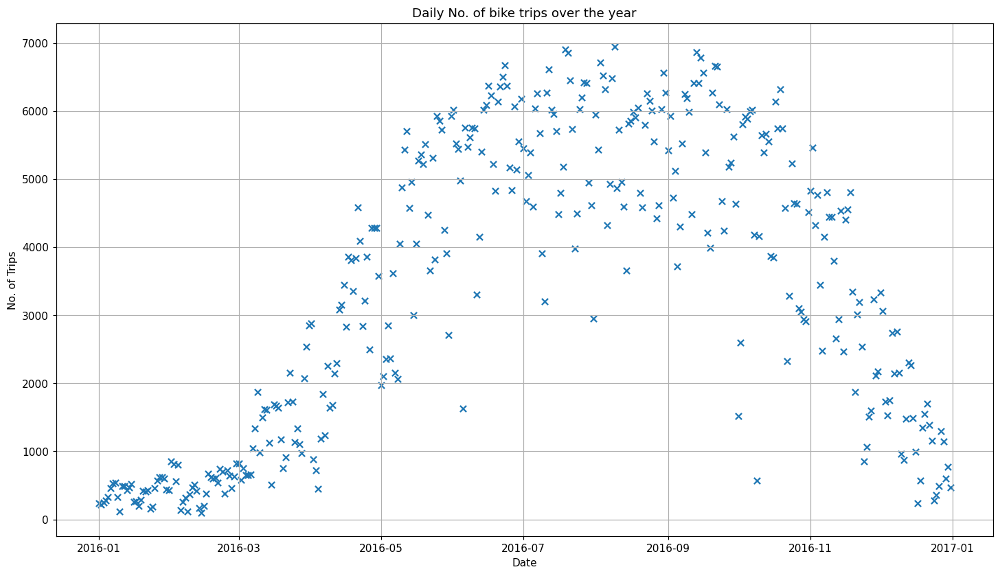

In [69]:
### dayly No. of bike trips over the year as scatter

bostonC_used = bostonC.groupby(["date"])["trip_id"].count()
#bostonC_used = pd.DataFrame(bostonC_used)

fig,ax = plt.subplots(figsize=(16,9), dpi=110) 

ax.scatter(bostonC_used.index, bostonC_used, marker="x")
plt.grid()
plt.title("Daily No. of bike trips over the year")
plt.xlabel("Date")
plt.ylabel("No. of Trips")
plt.show()

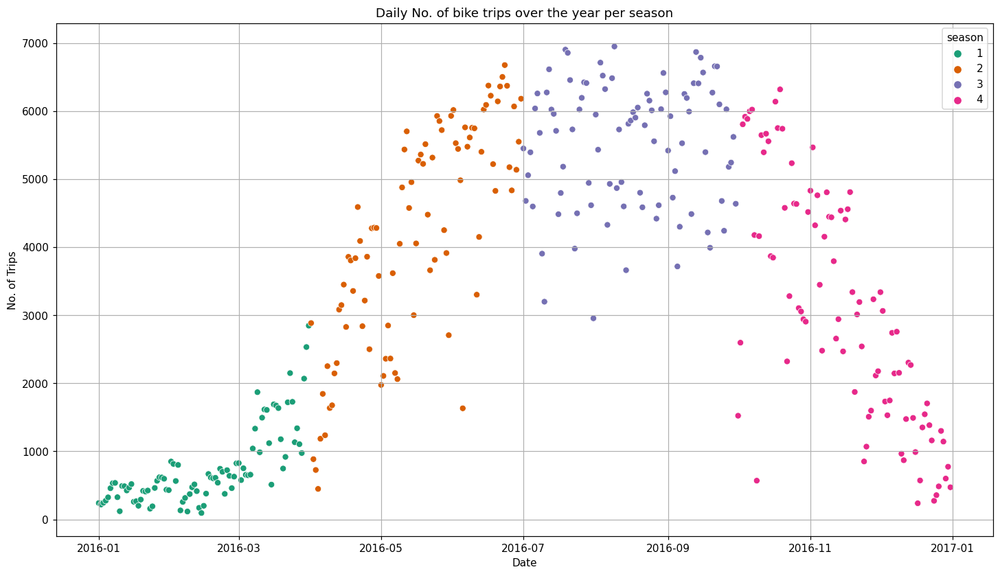

In [70]:
bostonC_used = bostonC.groupby(["date", "season"])["trip_id"].count()
bostonC_used = pd.DataFrame(bostonC_used)

fig,ax = plt.subplots(figsize=(16,9), dpi=110) 

sns.scatterplot(x=bostonC_used.index.get_level_values(0), y=bostonC_used["trip_id"], hue=bostonC_used.index.get_level_values(1),palette="Dark2")

plt.grid()
plt.title("Daily No. of bike trips over the year per season")
plt.xlabel("Date")
plt.ylabel("No. of Trips")
#plt.savefig("No.Bikes-season.pdf")
plt.show()

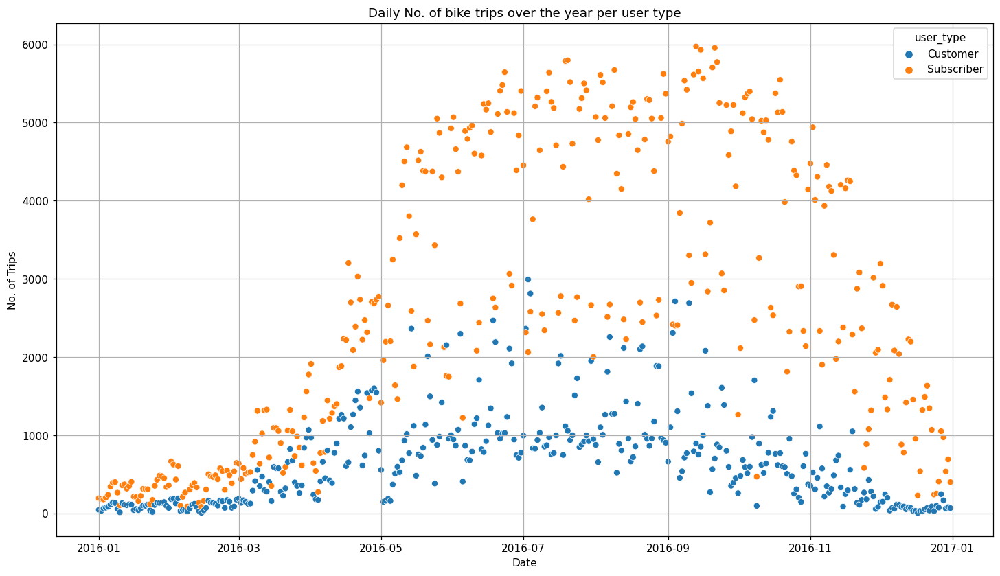

In [71]:
### dayly No. of bike trips over the year for each user type

bostonC_used = bostonC.groupby(["date", "user_type"])["trip_id"].count()
bostonC_used = pd.DataFrame(bostonC_used)

fig,ax = plt.subplots(figsize=(16,9), dpi=110) 

sns.scatterplot(x=bostonC_used.index.get_level_values(0), y=bostonC_used["trip_id"], hue=bostonC_used.index.get_level_values(1), ax=ax)
plt.grid()
plt.title("Daily No. of bike trips over the year per user type")
plt.xlabel("Date")
plt.ylabel("No. of Trips")
plt.show()

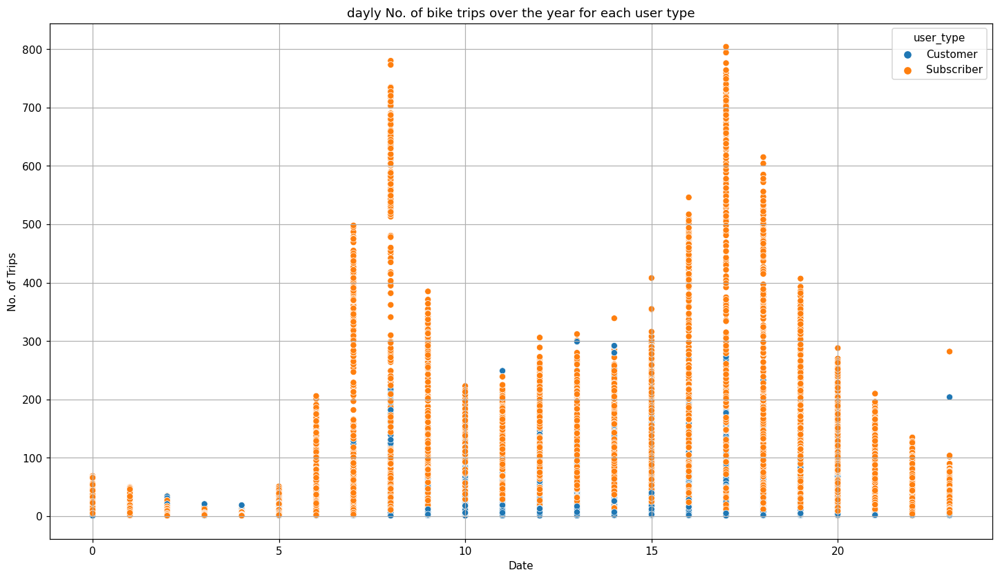

In [72]:
### dayly No. of bike trips over the year for each user type

bostonC_used = bostonC.groupby(["date", "hour", "user_type"])["trip_id"].count()
bostonC_used = pd.DataFrame(bostonC_used)

fig,ax = plt.subplots(figsize=(16,9), dpi=110) 

sns.scatterplot(x=bostonC_used.index.get_level_values(1), y=bostonC_used["trip_id"], hue=bostonC_used.index.get_level_values(2), ax=ax)
plt.grid()
plt.title("dayly No. of bike trips over the year for each user type")
plt.xlabel("Date")
plt.ylabel("No. of Trips")
plt.show()

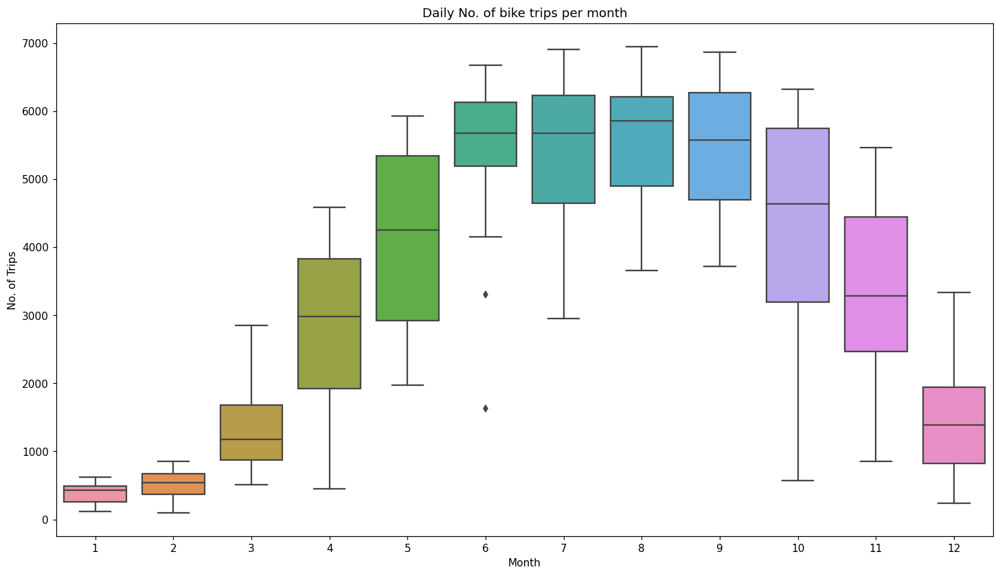

In [73]:
### dayly bikes trips per month

bostonC_used = bostonC.groupby(["date", "month"])["trip_id"].nunique()
bostonC_used = pd.DataFrame(bostonC_used)

fig,ax = plt.subplots(figsize=(16,9), dpi=110) 

sns.boxplot(x=bostonC_used.index.get_level_values(1), y=bostonC_used["trip_id"],ax=ax)
plt.title("Daily No. of bike trips per month")
plt.xlabel("Month")
plt.ylabel("No. of Trips")
plt.show()


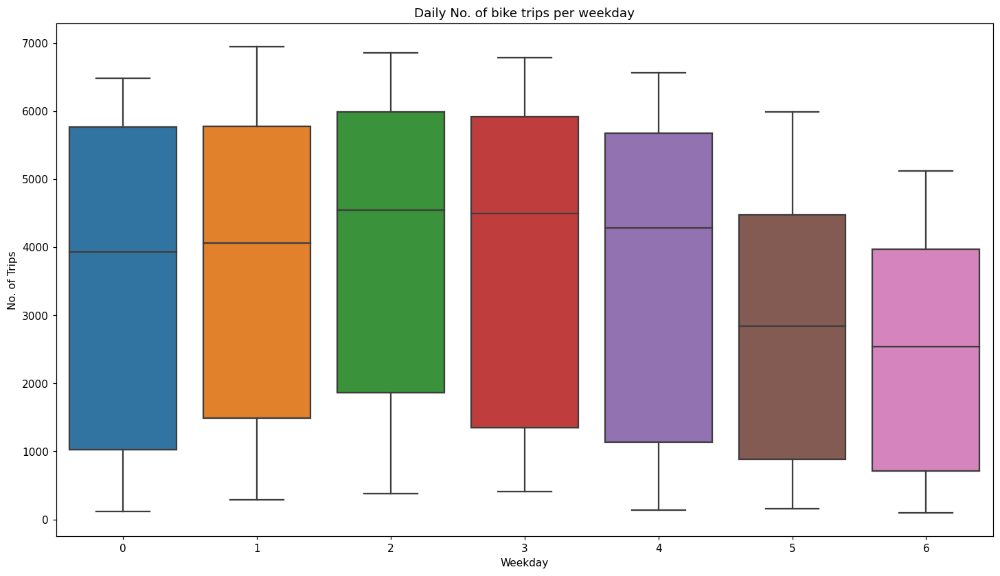

In [74]:
### dayly bikes trips per weekday

bostonC_used = bostonC.groupby(["date", "weekday"])["trip_id"].nunique()
bostonC_used = pd.DataFrame(bostonC_used)

fig,ax = plt.subplots(figsize=(16,9), dpi=110) 

sns.boxplot(x=bostonC_used.index.get_level_values(1), y=bostonC_used["trip_id"],ax=ax)
plt.title("Daily No. of bike trips per weekday")
plt.xlabel("Weekday")
plt.ylabel("No. of Trips")
plt.show()

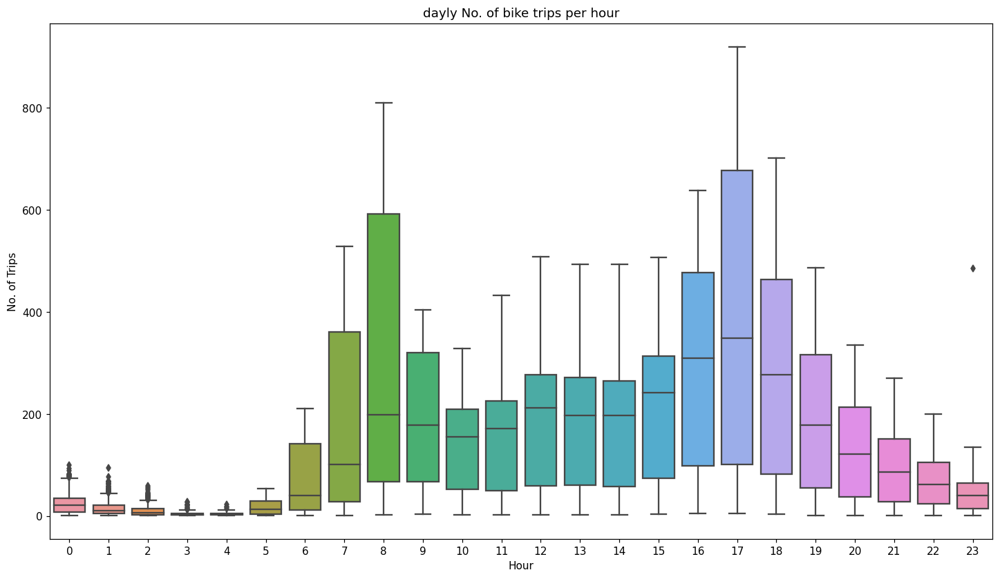

In [75]:
### dayly bike trips per hour

bostonC_used = bostonC.groupby(["date", "hour"])["trip_id"].count()
bostonC_used = pd.DataFrame(bostonC_used)

fig,ax = plt.subplots(figsize=(16,9), dpi=110) 

sns.boxplot(x=bostonC_used.index.get_level_values(1), y=bostonC_used["trip_id"],ax=ax)
plt.title("dayly No. of bike trips per hour")
plt.xlabel("Hour")
plt.ylabel("No. of Trips")
plt.show()

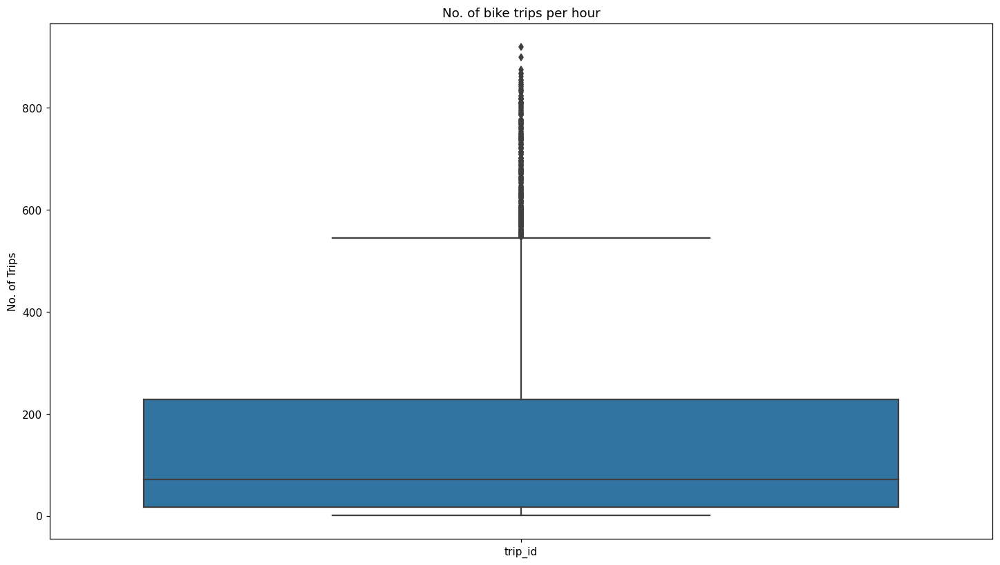

In [76]:
fig,ax = plt.subplots(figsize=(16,9), dpi=110) 

#sns.boxplot(x=bostonC_used.index.get_level_values(1), y=bostonC_used["trip_id"], hue="user_type",   ax=ax) #hue=bostonC_used.index.get_level_values(2),
sns.boxplot(data=bostonC_used[['trip_id']]) #hue=bostonC_used.index.get_level_values(2),
#sns.despine(offset=10, trim=True)
plt.title("No. of bike trips per hour")

plt.ylabel("No. of Trips")
plt.show()

In [77]:
Q1 = bostonC_used.trip_id.quantile(0.25)
Q3 = bostonC_used.trip_id.quantile(0.75)
IQR = Q3 - Q1

In [78]:
### no. of outliers
((bostonC_used.trip_id < (Q1 - 1.5 * IQR)) | (bostonC_used.trip_id > (Q3 + 1.5 * IQR))).sum()

319

In [79]:
bostonC_used.trip_id.sum()

1235121

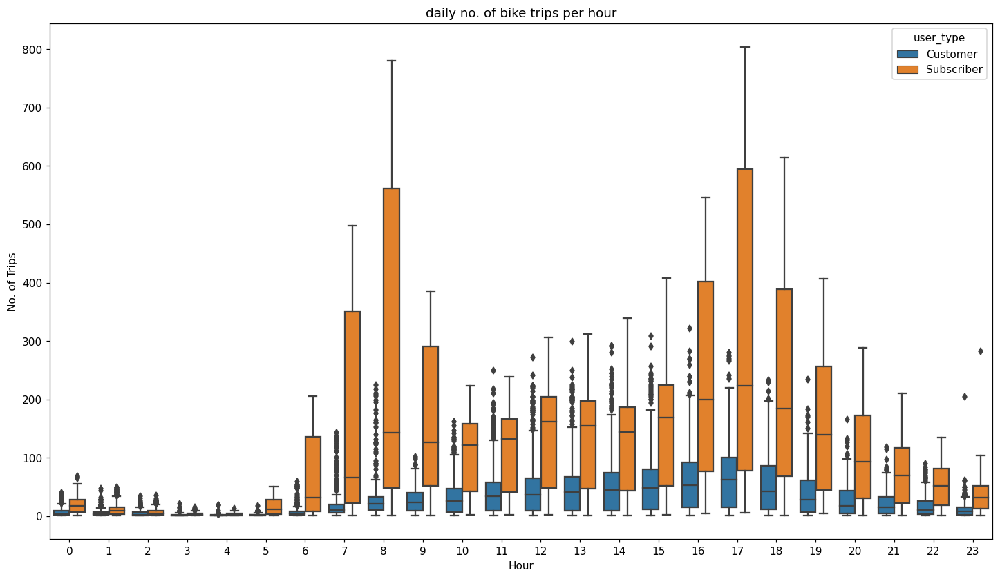

In [80]:
### dayly bike trips per hour

bostonC_used = bostonC.groupby(["date", "hour", "user_type"], as_index=False)["trip_id"].count()
bostonC_used = pd.DataFrame(bostonC_used)
#bostonC_used["user_type"] = bostonC_used.user_type.astype("category")

fig,ax = plt.subplots(figsize=(16,9), dpi=110) 

#sns.boxplot(x=bostonC_used.index.get_level_values(1), y=bostonC_used["trip_id"], hue="user_type",   ax=ax) #hue=bostonC_used.index.get_level_values(2),
sns.boxplot(x=bostonC_used["hour"], y=bostonC_used["trip_id"], hue=bostonC_used["user_type"],   ax=ax) #hue=bostonC_used.index.get_level_values(2),
#sns.despine(offset=10, trim=True)
plt.title("daily no. of bike trips per hour")
plt.xlabel("Hour")
plt.ylabel("No. of Trips")
plt.show()

#bostonC_used


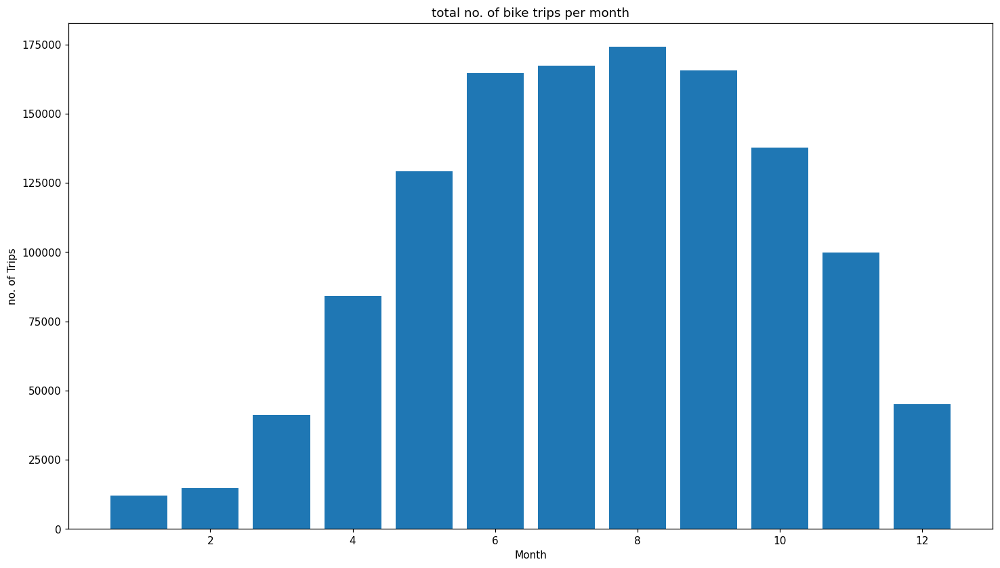

In [81]:
### No. of bike trips per month, 1 = Jan., 12 = Dec.

bostonC_used = bostonC.groupby(["month"])["trip_id"].nunique()

fig,ax = plt.subplots(figsize=(16,9), dpi=110) 

ax.bar(bostonC_used.index, bostonC_used)

plt.title("total no. of bike trips per month")
plt.xlabel("Month")
plt.ylabel("no. of Trips")
plt.show()

In [82]:
bostonC["month"].value_counts()

8     174092
7     167281
9     165597
6     164553
10    137790
5     129080
11     99845
4      84113
12     44951
3      41158
2      14623
1      12038
Name: month, dtype: int64

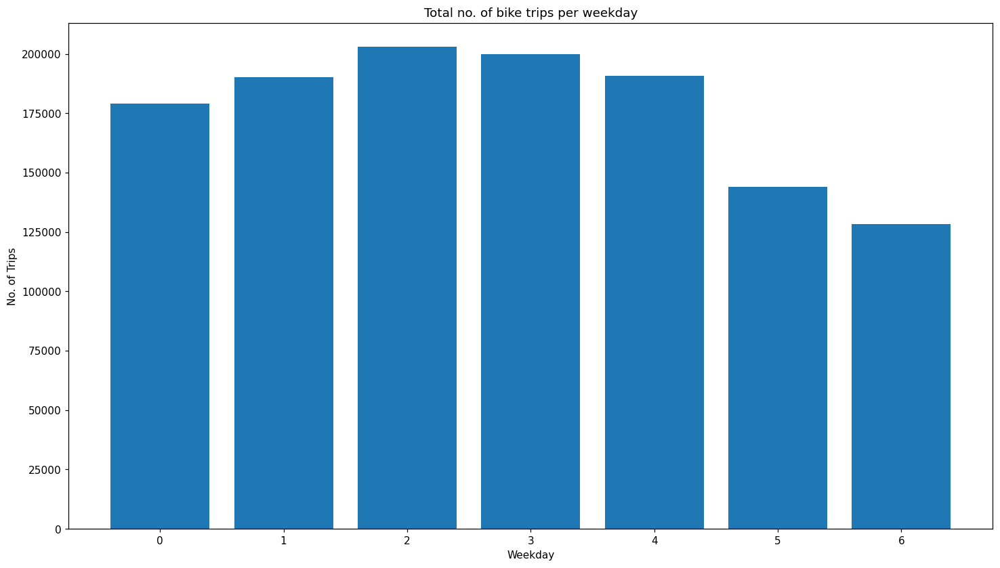

In [83]:
### No. of trips per weekday (0 = Monday, 6 = Sunday)

bostonC_used = bostonC.groupby(["weekday"])["trip_id"].nunique()

fig,ax = plt.subplots(figsize=(16,9), dpi=110) 

ax.bar(bostonC_used.index, bostonC_used)

plt.title("Total no. of bike trips per weekday")
plt.xlabel("Weekday")
plt.ylabel("No. of Trips")
plt.show()

In [84]:
bostonC["weekday"].value_counts()

2    202905
3    199816
4    190813
1    190235
0    179028
5    144045
6    128279
Name: weekday, dtype: int64

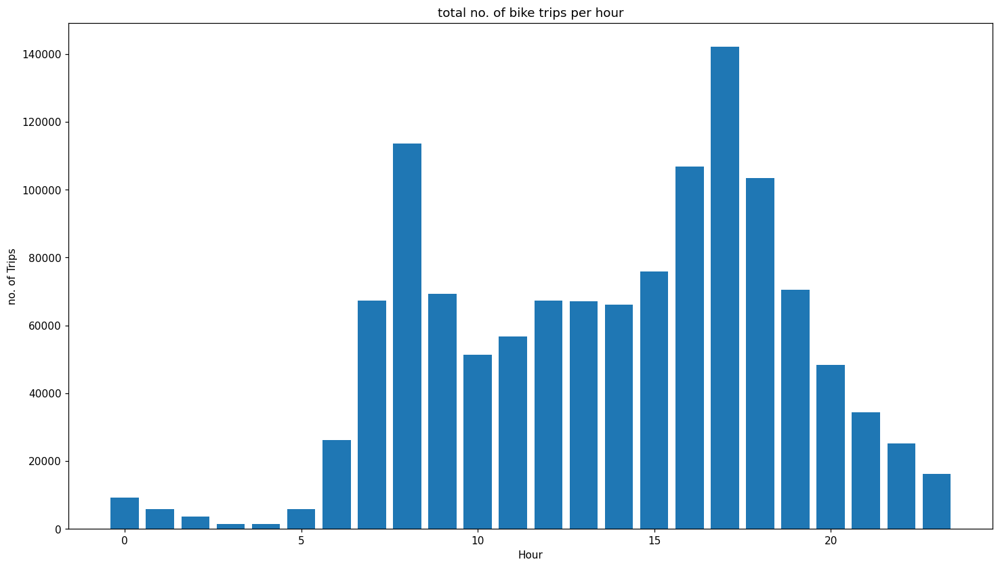

In [85]:
### No. of trips per hour 

bostonC_used = bostonC.groupby(["hour"])["trip_id"].nunique()

fig,ax = plt.subplots(figsize=(16,9), dpi=110) 

ax.bar(bostonC_used.index, bostonC_used)

plt.title("total no. of bike trips per hour")
plt.xlabel("Hour")
plt.ylabel("no. of Trips")
plt.show()

In [86]:
bostonC["hour"].value_counts()

17    142069
8     113589
16    106857
18    103373
15     75966
19     70553
9      69307
7      67316
12     67298
13     67166
14     66003
11     56706
10     51275
20     48314
21     34431
6      26118
22     25172
23     16234
0       9240
1       5894
5       5825
2       3636
3       1442
4       1337
Name: hour, dtype: int64

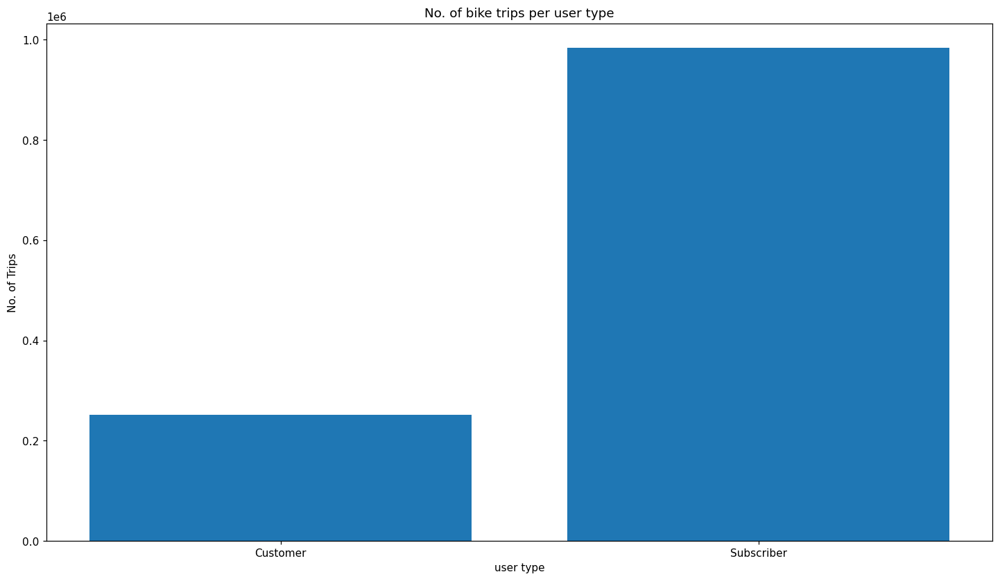

In [87]:
### No. of bike trips of each user type over the year 
bostonC_used = bostonC.groupby(["user_type"])["trip_id"].nunique()

fig,ax = plt.subplots(figsize=(16,9), dpi=110) 

ax.bar(bostonC_used.index, bostonC_used)

plt.title("No. of bike trips per user type")
plt.xlabel("user type")
plt.ylabel("No. of Trips")
plt.show()

In [88]:
bostonC["user_type"].value_counts()

Subscriber    983412
Customer      251709
Name: user_type, dtype: int64

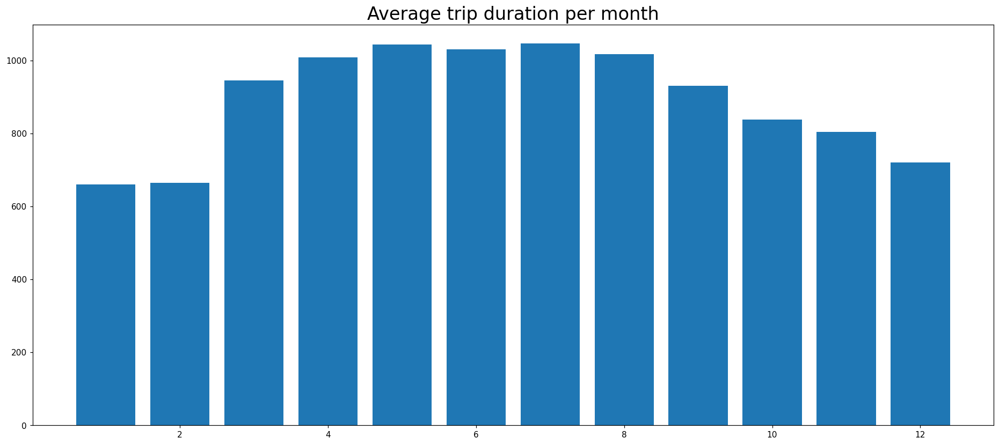

In [89]:
boston_trip = bostonC
boston_trip["trip_time"] = boston_trip["trip_time"].dt.total_seconds()

#Plot average trip duration per month
bostonC_duration = boston_trip.groupby(["month"])["trip_time"].mean()


fig,ax = plt.subplots(figsize=(21,9), dpi=110) 

ax.bar(bostonC_duration.index, bostonC_duration)
plt.title('Average trip duration per month',fontsize=22)

plt.show()

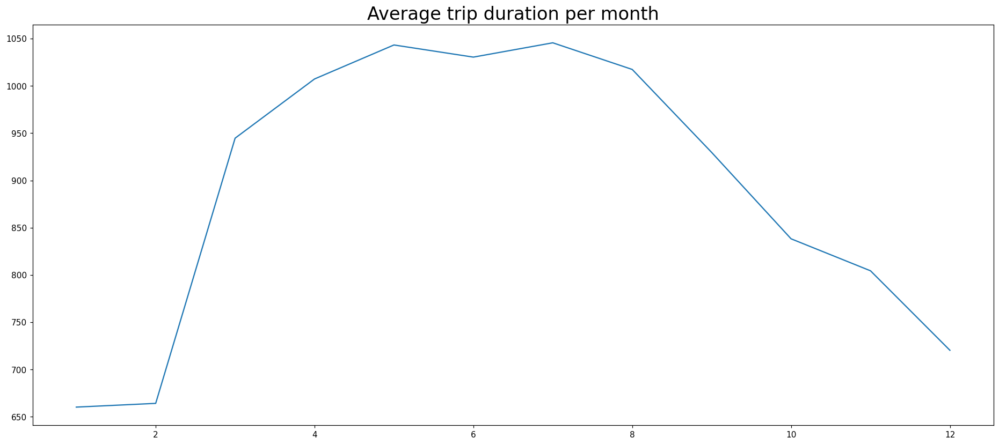

In [90]:
#The same data using a line graph
bostonC_duration = boston_trip.groupby(["month"])["trip_time"].mean()


fig,ax = plt.subplots(figsize=(21,9), dpi=110) 

ax.plot(bostonC_duration)
plt.title('Average trip duration per month',fontsize=22)
plt.show()

## We can see the trips are significantly longer in the warmer months of the year

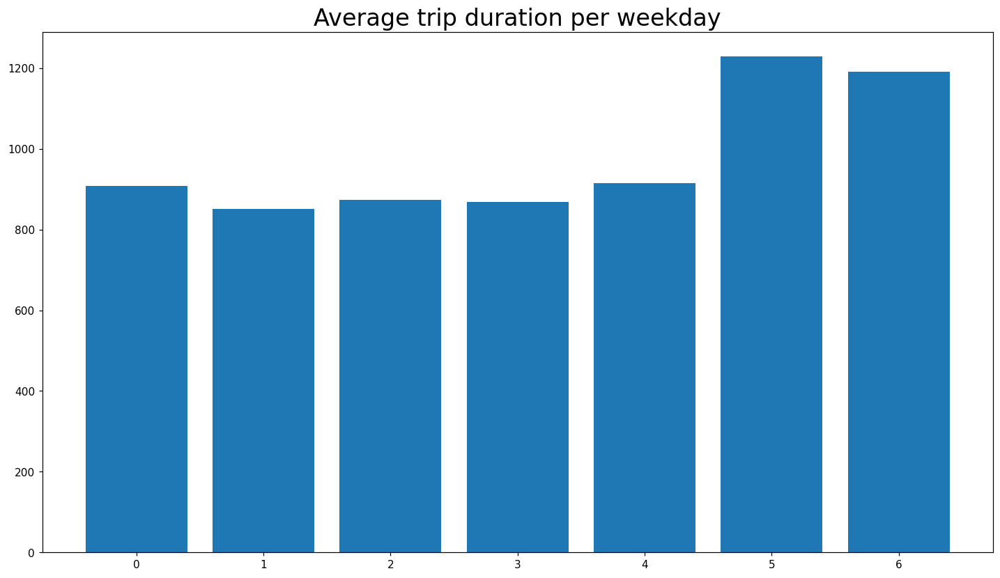

In [91]:
### weekdayly bike trips over the year (0 = Monday, 6 = Sunday)

bostonC_used = bostonC.groupby(["weekday"])["trip_time"].mean()

fig,ax = plt.subplots(figsize=(16,9), dpi=110) 

ax.bar(bostonC_used.index, bostonC_used)
plt.title('Average trip duration per weekday',fontsize=22)
plt.show()

## We notice that the trip duration rises by a good margin on Saturday and Sunday. This can be the result of people taking bikes to ride around the city for fun on the weekend, as oppose to Monday-Friday when more people use the bikes to run errands or go to work.

###
bike fleet usage analysis

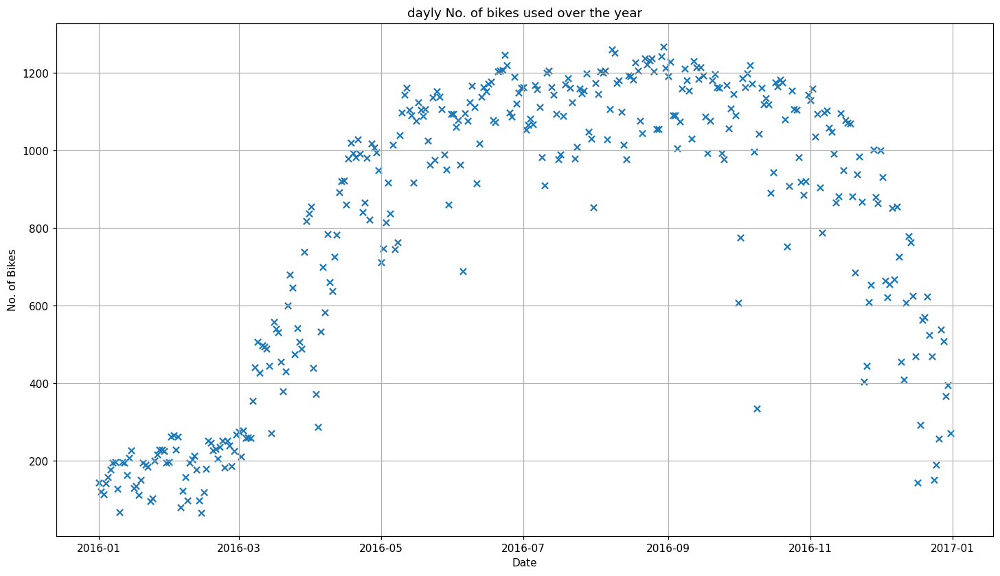

In [92]:
### dayly No. of bikes used over the year

bostonC_used = bostonC.groupby(["date"])["bike_id"].nunique()
#bostonC_used = pd.DataFrame(bostonC_used)

fig,ax = plt.subplots(figsize=(16,9), dpi=110) 

ax.scatter(bostonC_used.index, bostonC_used, marker="x")
plt.grid()
plt.title("dayly No. of bikes used over the year")
plt.xlabel("Date")
plt.ylabel("No. of Bikes")
plt.show()

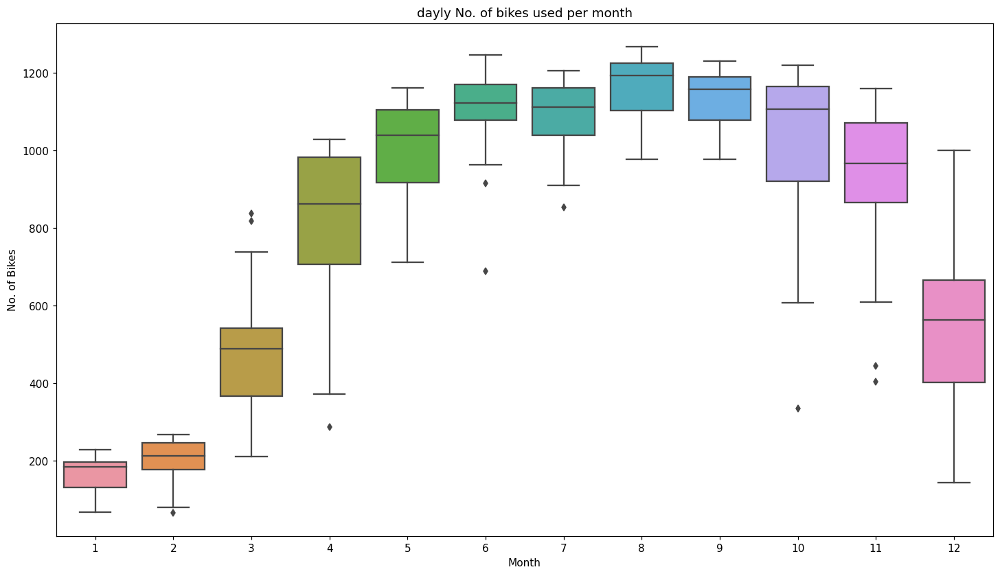

In [93]:
### dayly bikes used per month

bostonC_used = bostonC.groupby(["date", "month"])["bike_id"].nunique()
bostonC_used = pd.DataFrame(bostonC_used)

fig,ax = plt.subplots(figsize=(16,9), dpi=110) 

sns.boxplot(x=bostonC_used.index.get_level_values(1), y=bostonC_used["bike_id"],ax=ax)
plt.title("dayly No. of bikes used per month")
plt.xlabel("Month")
plt.ylabel("No. of Bikes")
plt.show()

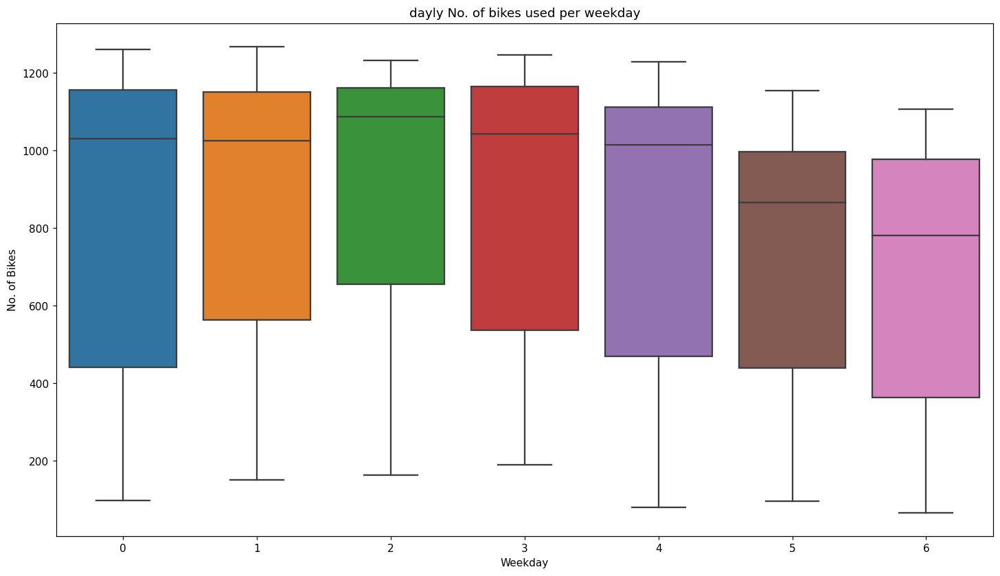

In [94]:
### dayly bikes used per weekday

bostonC_used = bostonC.groupby(["date", "weekday"])["bike_id"].nunique()
bostonC_used = pd.DataFrame(bostonC_used)

fig,ax = plt.subplots(figsize=(16,9), dpi=110) 

sns.boxplot(x=bostonC_used.index.get_level_values(1), y=bostonC_used["bike_id"],ax=ax)
plt.title("dayly No. of bikes used per weekday")
plt.xlabel("Weekday")
plt.ylabel("No. of Bikes")
plt.show()

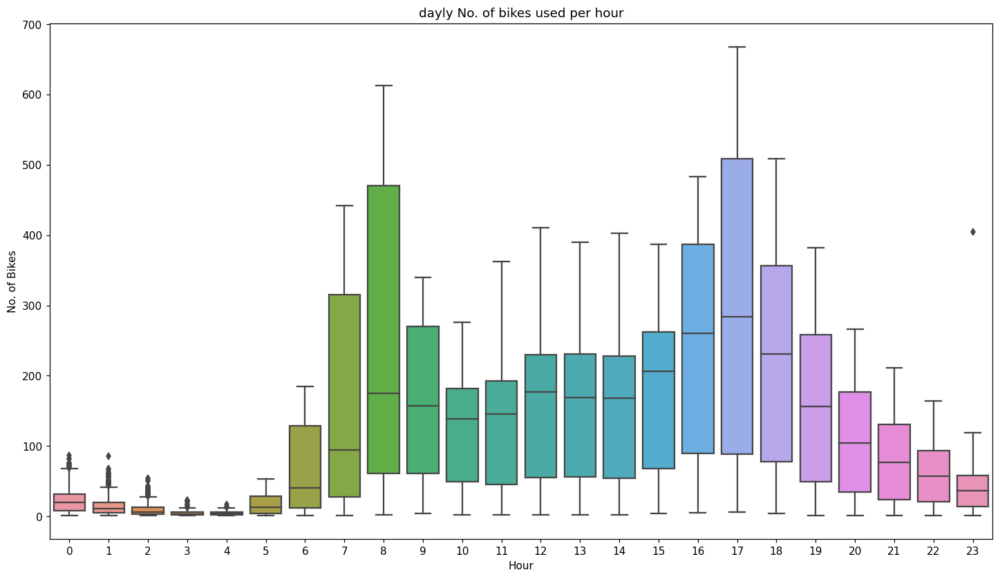

In [95]:
### bikes used per hour

bostonC_used = bostonC.groupby(["date", "hour"])["bike_id"].nunique()
bostonC_used = pd.DataFrame(bostonC_used)

fig,ax = plt.subplots(figsize=(16,9), dpi=110) 

sns.boxplot(x=bostonC_used.index.get_level_values(1), y=bostonC_used["bike_id"],ax=ax)
plt.title("dayly No. of bikes used per hour")
plt.xlabel("Hour")
plt.ylabel("No. of Bikes")
plt.show()

### Geographical Demand Patterns
Station analysis

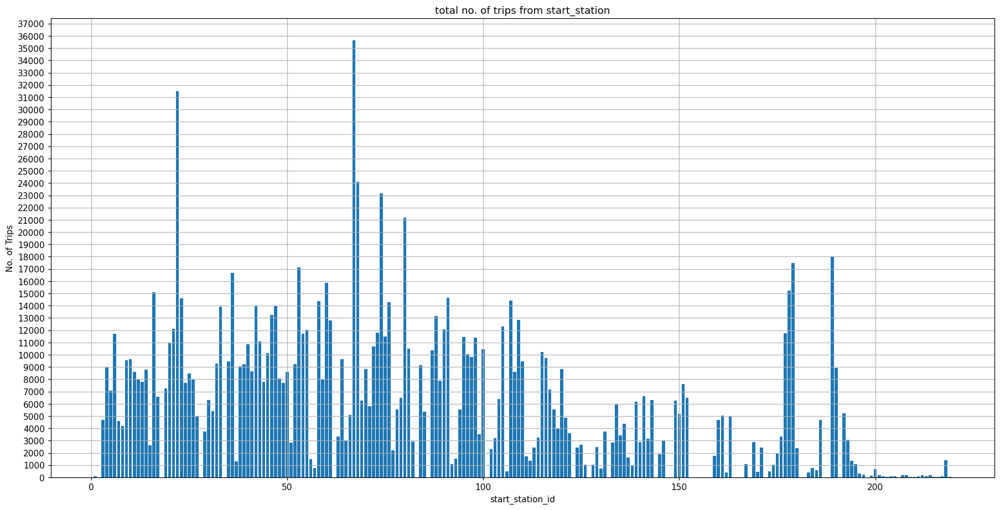

In [96]:
### No. of trips from start_station
bostonS = bostonC.groupby(["start_station_id"])["trip_id"].nunique()

fig,ax = plt.subplots(figsize=(20,10), dpi=110) 

ax.bar(bostonS.index, bostonS)
ax.set_yticks(range(0,38000,1000))
#ax.set_xticks(range(0,220,1))
plt.title("total no. of trips from start_station")
plt.xlabel("start_station_id")
plt.ylabel("No. of Trips")
plt.grid()
plt.show()

In [97]:
bostonC["start_station_id"].value_counts()

67     35638
22     31507
68     24106
74     23159
80     21175
       ...  
216       43
209       31
219       23
153        2
158        1
Name: start_station_id, Length: 189, dtype: int64

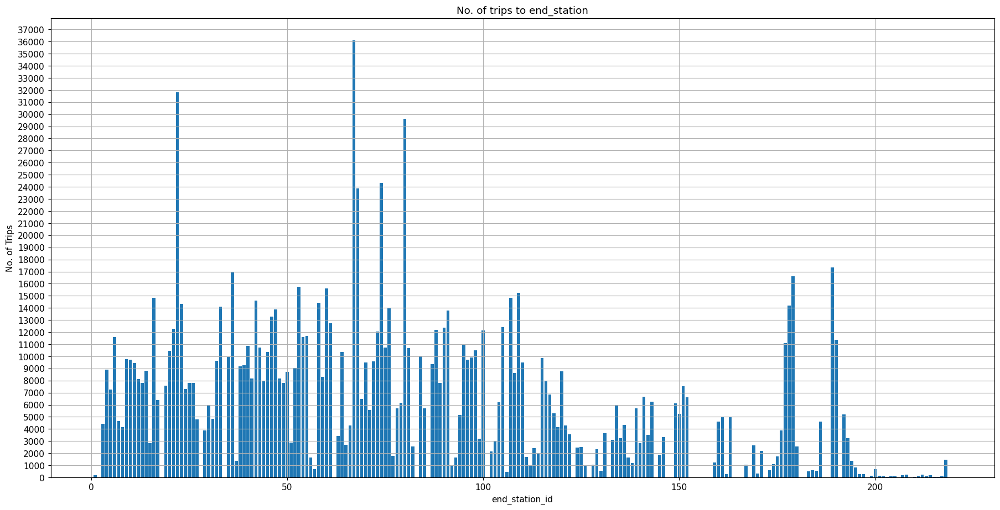

In [98]:
### No. of trips to end_station
bostonS = bostonC.groupby(["end_station_id"])["trip_id"].nunique()

fig,ax = plt.subplots(figsize=(20,10), dpi=110) 

ax.bar(bostonS.index, bostonS)
ax.set_yticks(range(0,38000,1000))
#ax.set_xticks(range(0,220,1))
plt.title("No. of trips to end_station")
plt.xlabel("end_station_id")
plt.ylabel("No. of Trips")
plt.grid()
plt.show()

In [99]:
bostonC["end_station_id"].value_counts()

67     36099
22     31800
80     29628
74     24335
68     23858
       ...  
215       36
209       21
219       12
153        2
158        1
Name: end_station_id, Length: 189, dtype: int64

In [100]:
### No. of Trips with same start and end station id
len(bostonC.loc[bostonC.start_station_id == bostonC.end_station_id])

38533

In [101]:
#stop execution 
    
#raise SystemExit("Stop right there!")

###
### Attention!
### due to performance issues we out commented the heat maps below
### please use only one at a time, as JupyterLab gets very slow otherwise
###

### Visualize the geographical position of the stations

In [102]:
# folium needs the coordinates in one variable, so putting the values together.

# We're rounding the corrdinates to 4 digits in order to remove some inaccuracies while getting the data.
merged_df["Coordinates_Start"] = list(zip(merged_df["Latitude_Start"].round(4),merged_df["Longitude_Start"].round(4))) 
merged_df["Coordinates_End"] = list(zip(merged_df["Latitude_End"].round(4),merged_df["Longitude_End"].round(4))) 
merged_df.head(5)

,start_time,end_time,start_station_id,end_station_id,start_station_name,end_station_name,bike_id,user_type,Latitude_Start,Longitude_Start,Latitude_End,Longitude_End,Coordinates_Start,Coordinates_End
0,2016-01-01 00:08:07,2016-01-01 00:40:26,36,19,Boston Public Library - 700 Boylston St.,Buswell St. at Park Dr.,1406,Subscriber,42.349673,-71.077303,42.347241,-71.105301,"(42.3497, -71.0773)","(42.3472, -71.1053)"
1,2016-01-01 00:08:19,2016-01-01 00:40:27,36,19,Boston Public Library - 700 Boylston St.,Buswell St. at Park Dr.,1121,Subscriber,42.349673,-71.077303,42.347241,-71.105301,"(42.3497, -71.0773)","(42.3472, -71.1053)"
2,2016-01-01 00:10:15,2016-01-01 00:40:29,36,19,Boston Public Library - 700 Boylston St.,Buswell St. at Park Dr.,474,Subscriber,42.349673,-71.077303,42.347241,-71.105301,"(42.3497, -71.0773)","(42.3472, -71.1053)"
3,2016-01-01 00:10:22,2016-01-01 00:40:11,36,19,Boston Public Library - 700 Boylston St.,Buswell St. at Park Dr.,1504,Subscriber,42.349673,-71.077303,42.347241,-71.105301,"(42.3497, -71.0773)","(42.3472, -71.1053)"
4,2016-01-01 00:15:36,2016-01-01 00:31:17,36,67,Boston Public Library - 700 Boylston St.,MIT at Mass Ave / Amherst St,913,Customer,42.349673,-71.077303,42.358100,-71.093198,"(42.3497, -71.0773)","(42.3581, -71.0932)"


##### Stations that are frequently used to start a trip

In [103]:
#heat_map = folium.Map(location=(42.36, -71.071), tiles='Stamen Toner',zoom_start=12, control_scale=True, max_zoom=20)

# add heat map
#heat_map.add_child(plugins.HeatMap(merged_df["Coordinates_Start"], radius=20))

#heat_map

##### Stations that are frequently used to end a trip

In [104]:
#heat_map = folium.Map(location=(42.36, -71.071), tiles='Stamen Toner',zoom_start=12, control_scale=True, max_zoom=20)

# add heat map
#heat_map.add_child(plugins.HeatMap(merged_df["Coordinates_End"], radius=20))

#heat_map

We see almost no differences, **but some stations** (see e. g. `Hardvard Street`) **at the outside of the city are more often used to rent a bike** (likely people how use the bike to travel back inside the city) **instead of returning a bike**.
_(Note: You have to zoom into both maps, to see the difference)_ 

This could indicate that BlueBikes need to pay attention especially to these outside bike stations in order to initiate inventory movements or provide some incentives (like discounts) for the people who start a trip in the city and bring the bike back e. g. to the station next to `Hardvard Street`.

##### Frequently used stations (no matter whether used as start OR end station)

In [105]:
#generating a new list holding all coordinates of the trips
def addCoordinatesToList(coordinates, list):
    list.append(coordinates)

list_with_start_and_end_coordinates = []
merged_df["Coordinates_Start"].apply(lambda x: addCoordinatesToList(x, list_with_start_and_end_coordinates))
merged_df["Coordinates_End"].apply(lambda x: addCoordinatesToList(x, list_with_start_and_end_coordinates))
list_with_start_and_end_coordinates[0:5] #holds a list with all coordaintes of the data table

[(42.3497, -71.0773),
 (42.3497, -71.0773),
 (42.3497, -71.0773),
 (42.3497, -71.0773),
 (42.3497, -71.0773)]

In [106]:
#heat_map = folium.Map(location=(42.36, -71.071), tiles='Stamen Toner',zoom_start=12, control_scale=True, max_zoom=20)

# add heat map
#heat_map.add_child(plugins.HeatMap(list_with_start_and_end_coordinates, radius=20))

#heat_map

In conclusion, this map provides an total overview of the activity level of the different stations. This can be useful to determine stations, that are not used frequently and thus, could be removed.

###
### Key Performance Indicators (KPIs)

##### Fleet Utilization

The fleet utilization

Determine the fleet size

In [107]:
### fleet size
bikes = bostonC["bike_id"].nunique()
print(bikes)

1802


According to the blue bikes website (https://www.bluebikes.com/system-data) the fleet had 1500 Bikes in the beginning of 2016 and 1800 at the end of 2016

As we dont know when exactly the fleet grow up to 1800 Bikes, we calculate the fleet utilization for all day of 2016 with the No. of Bikes at the end of 2016

Calculate hourly fleet utilization data

In [108]:
### hourly fleet Utilization in No. of Bikes and %

bostonP = bostonC.groupby(["date", "hour"])
bostonPc = pd.DataFrame(bostonP.size(), columns=["bike_id"])
bostonPc["fleet_util"] = bostonPc["bike_id"] /bikes *100
print(bostonPc)

                 bike_id  fleet_util
date       hour                     
2016-01-01 0          13    0.721421
           1          14    0.776915
           2           9    0.499445
           3           1    0.055494
           6           1    0.055494
...                  ...         ...
2016-12-31 19         20    1.109878
           20         13    0.721421
           21         22    1.220866
           22          6    0.332963
           23          6    0.332963

[8548 rows x 2 columns]


In [109]:
bostonPc.info()

<class 'pandas.core.frame.DataFrame'>
MultiIndex: 8548 entries, (Timestamp('2016-01-01 00:00:00'), 0) to (Timestamp('2016-12-31 00:00:00'), 23)
Data columns (total 2 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   bike_id     8548 non-null   int64  
 1   fleet_util  8548 non-null   float64
dtypes: float64(1), int64(1)
memory usage: 161.8 KB


merge Timestamp and hour into a single index

In [110]:
fleet_util = bostonPc
fleet_util.index = pd.to_datetime(fleet_util.index.get_level_values(0).astype(str) + '-' +
               fleet_util.index.get_level_values(1).astype(str),
               format="%Y-%m-%d-%H")

In [111]:
fleet_util

,bike_id,fleet_util
2016-01-01 00:00:00,13,0.721421
2016-01-01 01:00:00,14,0.776915
2016-01-01 02:00:00,9,0.499445
2016-01-01 03:00:00,1,0.055494
2016-01-01 06:00:00,1,0.055494
...,...,...
2016-12-31 19:00:00,20,1.109878
2016-12-31 20:00:00,13,0.721421
2016-12-31 21:00:00,22,1.220866
2016-12-31 22:00:00,6,0.332963


##### visualize the fleet utilization data 

plotly with range slider, use right slider to select a time point, then click 2d and hover over the plot for data (date, hour, fleet uitl. in %)

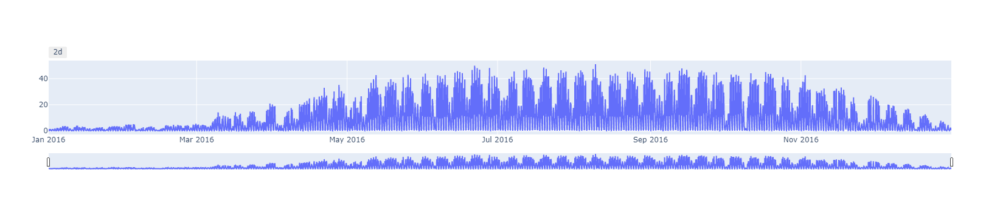

In [112]:
x =  fleet_util.index.get_level_values(0) 
y = fleet_util['fleet_util']

plot = px.Figure(data=[px.Scatter(
    x=x,
    y=y,
    mode='lines',)
])

plot.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=2,
                     step="day",
                     stepmode="backward"),
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
    )
)
  
plot.show()

### source: https://www.geeksforgeeks.org/how-to-make-range-slider-and-selector-in-plotly/

In [113]:
fleet_util.describe()

,bike_id,fleet_util
count,8548.000000,8548.000000
mean,144.492396,8.018446
std,167.672471,9.304799
min,1.000000,0.055494
25%,18.000000,0.998890
50%,71.000000,3.940067
75%,229.000000,12.708102
max,920.000000,51.054384


The fleet utilization usually peaks at 5pm and 8am, so usually around the times when people go to work/school and go back home

As we used the total fleet size of 1802 Bikes for calculating the fleet utilization, because we dont have information/data about how many bikes of the fleet were available for the users at what timepoint,
the max utilization of 51% seems a bit low


In [114]:
#stop execution 
    
#raise SystemExit("Stop right there!")

###
### KPI the distribution of trips among user types

In [115]:
## hourly fleet Utilization in No. of Bikes and %

bostonU = bostonC
bostonU["IsSubscriber"] = bostonU["user_type"].apply(lambda x: 1 if x=="Subscriber" else 0)
bostonU["IsCustomer"] = bostonU["user_type"].apply(lambda x: 1 if x=="Customer" else 0)

#bostonU

In [116]:
bostonU_s = bostonU.groupby(["date", "hour"], as_index=False)["IsSubscriber"].sum()
bostonU_c = bostonU.groupby(["date", "hour"], as_index=False)["IsCustomer"].sum()
bostonUt = pd.merge(bostonU_s, bostonU_c)
#bostonUt["total users"] = (bostonUt.user_typer == "Customer") + bostonUt.user_typer == "Subscriber"
print(bostonUt)

           date  hour  IsSubscriber  IsCustomer
0    2016-01-01     0            12           1
1    2016-01-01     1            10           4
2    2016-01-01     2             8           1
3    2016-01-01     3             1           0
4    2016-01-01     6             1           0
...         ...   ...           ...         ...
8543 2016-12-31    19            15           5
8544 2016-12-31    20             9           4
8545 2016-12-31    21            20           2
8546 2016-12-31    22             4           2
8547 2016-12-31    23             6           0

[8548 rows x 4 columns]


In [117]:
bostonUt["total_users"] = bostonUt["IsSubscriber"] + bostonUt["IsCustomer"]
print(bostonUt)

           date  hour  IsSubscriber  IsCustomer  total_users
0    2016-01-01     0            12           1           13
1    2016-01-01     1            10           4           14
2    2016-01-01     2             8           1            9
3    2016-01-01     3             1           0            1
4    2016-01-01     6             1           0            1
...         ...   ...           ...         ...          ...
8543 2016-12-31    19            15           5           20
8544 2016-12-31    20             9           4           13
8545 2016-12-31    21            20           2           22
8546 2016-12-31    22             4           2            6
8547 2016-12-31    23             6           0            6

[8548 rows x 5 columns]


In [118]:
bostonUt["%_Subsciber"] = bostonUt["IsSubscriber"] / bostonUt["total_users"] *100
bostonUt["%_Customer"] = bostonUt["IsCustomer"] / bostonUt["total_users"] *100
bostonUt

,date,hour,IsSubscriber,IsCustomer,total_users,%_Subsciber,%_Customer
0,2016-01-01,0,12,1,13,92.307692,7.692308
1,2016-01-01,1,10,4,14,71.428571,28.571429
2,2016-01-01,2,8,1,9,88.888889,11.111111
3,2016-01-01,3,1,0,1,100.000000,0.000000
4,2016-01-01,6,1,0,1,100.000000,0.000000
...,...,...,...,...,...,...,...
8543,2016-12-31,19,15,5,20,75.000000,25.000000
8544,2016-12-31,20,9,4,13,69.230769,30.769231
8545,2016-12-31,21,20,2,22,90.909091,9.090909
8546,2016-12-31,22,4,2,6,66.666667,33.333333


In [119]:
bostonUt.describe()

,hour,IsSubscriber,IsCustomer,total_users,%_Subsciber,%_Customer
count,8548.000000,8548.000000,8548.000000,8548.000000,8548.000000,8548.000000
mean,11.695952,115.045859,29.446537,144.492396,79.421894,20.578106
std,6.882939,143.020324,42.994829,167.672471,16.964094,16.964094
min,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000
25%,6.000000,14.000000,2.000000,18.000000,70.000000,7.142857
50%,12.000000,55.000000,11.000000,71.000000,81.729825,18.270175
75%,18.000000,171.000000,41.000000,229.000000,92.857143,30.000000
max,23.000000,804.000000,322.000000,920.000000,100.000000,100.000000


In [120]:
bostonUt["date_time"] = pd.to_datetime(bostonUt["date"].astype(str) + '-' +
               bostonUt["hour"].astype(str),
               format="%Y-%m-%d-%H")

bostonUt

,date,hour,IsSubscriber,IsCustomer,total_users,%_Subsciber,%_Customer,date_time
0,2016-01-01,0,12,1,13,92.307692,7.692308,2016-01-01 00:00:00
1,2016-01-01,1,10,4,14,71.428571,28.571429,2016-01-01 01:00:00
2,2016-01-01,2,8,1,9,88.888889,11.111111,2016-01-01 02:00:00
3,2016-01-01,3,1,0,1,100.000000,0.000000,2016-01-01 03:00:00
4,2016-01-01,6,1,0,1,100.000000,0.000000,2016-01-01 06:00:00
...,...,...,...,...,...,...,...,...
8543,2016-12-31,19,15,5,20,75.000000,25.000000,2016-12-31 19:00:00
8544,2016-12-31,20,9,4,13,69.230769,30.769231,2016-12-31 20:00:00
8545,2016-12-31,21,20,2,22,90.909091,9.090909,2016-12-31 21:00:00
8546,2016-12-31,22,4,2,6,66.666667,33.333333,2016-12-31 22:00:00


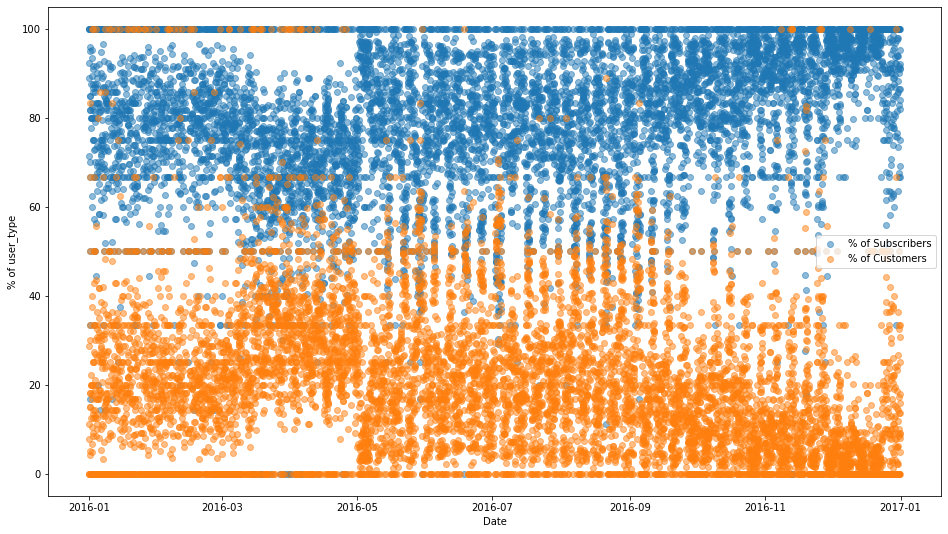

In [121]:
plt.figure(figsize = (16,9))



plt.scatter(bostonUt["date_time"], 
         bostonUt["%_Subsciber"], 
         label="% of Subscribers", alpha=0.5)
plt.scatter(bostonUt["date_time"], 
         bostonUt["%_Customer"], 
         label="% of Customers", alpha=0.5)

plt.xlabel("Date")
plt.ylabel("% of user_type")

plt.legend()
plt.show()

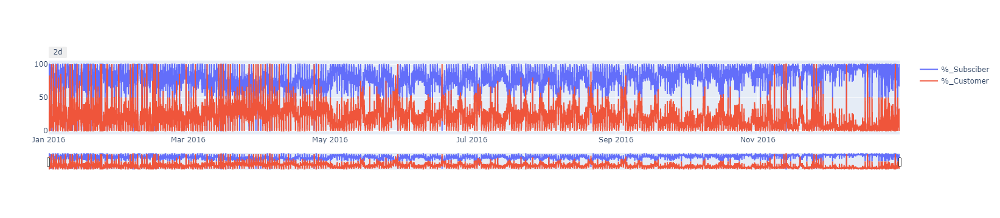

In [122]:
plot = px.Figure()

plot.add_trace(px.Scatter(x=bostonUt["date_time"],
                         y= bostonUt["%_Subsciber"],
                         name="%_Subsciber"))
plot.add_trace(px.Scatter(x=bostonUt["date_time"],
                         y= bostonUt["%_Customer"],
                         name="%_Customer"))

plot.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=2,
                     step="day",
                     stepmode="backward"),
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
    )
)
  
plot.show()


In [123]:
bostonUt.describe()

,hour,IsSubscriber,IsCustomer,total_users,%_Subsciber,%_Customer
count,8548.000000,8548.000000,8548.000000,8548.000000,8548.000000,8548.000000
mean,11.695952,115.045859,29.446537,144.492396,79.421894,20.578106
std,6.882939,143.020324,42.994829,167.672471,16.964094,16.964094
min,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000
25%,6.000000,14.000000,2.000000,18.000000,70.000000,7.142857
50%,12.000000,55.000000,11.000000,71.000000,81.729825,18.270175
75%,18.000000,171.000000,41.000000,229.000000,92.857143,30.000000
max,23.000000,804.000000,322.000000,920.000000,100.000000,100.000000


###
### KPI no. of trips with overtime per hour and user type

In [124]:
bostonU["trip_time_s"] = bostonU["trip_time"]
#bostonU["trip_time_s"] = bostonU["trip_time"].dt.seconds

In [125]:
#bostonU.info()

###
### use histrorical business model, wehere all pass included 30min trips, after that overtime fees, after 25hours lost/stolen bike 

In [126]:
### Subscribers overtime
bostonU["overtime_s"] = bostonU["trip_time_s"].where((bostonU["IsSubscriber"] == 1) & (bostonU["trip_time_s"] > 1800)) 

### Customers overtime
bostonU["overtime_c"] = bostonU["trip_time_s"].where((bostonU["IsCustomer"] == 1) & (bostonU["trip_time_s"] >1800)) 
#bostonU


In [127]:
bostonU[bostonU["overtime_s"] > 1800]

,start_time,end_time,start_station_id,end_station_id,start_station_name,end_station_name,bike_id,user_type,trip_time,trip_id,...,month,weekday,hour,minute,season,IsSubscriber,IsCustomer,trip_time_s,overtime_s,overtime_c
0,2016-01-01 00:08:07,2016-01-01 00:40:26,36,19,Boston Public Library - 700 Boylston St.,Buswell St. at Park Dr.,1406,Subscriber,1939.0,1,...,1,4,0,8,1,1,0,1939.0,1939.0,NaN
1,2016-01-01 00:08:19,2016-01-01 00:40:27,36,19,Boston Public Library - 700 Boylston St.,Buswell St. at Park Dr.,1121,Subscriber,1928.0,2,...,1,4,0,8,1,1,0,1928.0,1928.0,NaN
2,2016-01-01 00:10:15,2016-01-01 00:40:29,36,19,Boston Public Library - 700 Boylston St.,Buswell St. at Park Dr.,474,Subscriber,1814.0,3,...,1,4,0,10,1,1,0,1814.0,1814.0,NaN
16,2016-01-01 01:22:29,2016-01-01 04:27:34,74,22,Harvard Square at Mass Ave/ Dunster,South Station - 700 Atlantic Ave.,232,Subscriber,11105.0,17,...,1,4,1,22,1,1,0,11105.0,11105.0,NaN
17,2016-01-01 01:27:24,2016-01-01 04:27:28,74,22,Harvard Square at Mass Ave/ Dunster,South Station - 700 Atlantic Ave.,1162,Subscriber,10804.0,18,...,1,4,1,27,1,1,0,10804.0,10804.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1234636,2016-12-30 23:18:17,2016-12-30 23:55:34,87,87,Harvard University Housing - 115 Putnam Ave at...,Harvard University Housing - 115 Putnam Ave at...,1728,Subscriber,2237.0,1234637,...,12,4,23,18,4,1,0,2237.0,2237.0,NaN
1234655,2016-12-31 01:08:13,2016-12-31 01:44:54,6,196,Cambridge St at Joy St,Roxbury YMCA - Warren St at MLK Blvd,133,Subscriber,2201.0,1234656,...,12,5,1,8,4,1,0,2201.0,2201.0,NaN
1234744,2016-12-31 10:45:27,2016-12-31 11:16:25,19,19,Park Dr at Buswell St,Park Dr at Buswell St,1644,Subscriber,1858.0,1234745,...,12,5,10,45,4,1,0,1858.0,1858.0,NaN
1234813,2016-12-31 12:30:44,2016-12-31 13:01:55,23,47,Boston City Hall - 28 State St,Cross St at Hanover St,1836,Subscriber,1871.0,1234814,...,12,5,12,30,4,1,0,1871.0,1871.0,NaN


In [128]:
bostonU[bostonU["overtime_c"] > 1800]

,start_time,end_time,start_station_id,end_station_id,start_station_name,end_station_name,bike_id,user_type,trip_time,trip_id,...,month,weekday,hour,minute,season,IsSubscriber,IsCustomer,trip_time_s,overtime_s,overtime_c
79,2016-01-01 12:12:05,2016-01-01 14:14:54,96,96,Cambridge Main Library at Broadway / Trowbridg...,Cambridge Main Library at Broadway / Trowbridg...,751,Customer,7369.0,80,...,1,4,12,12,1,0,1,7369.0,NaN,7369.0
395,2016-01-02 17:27:23,2016-01-02 18:15:41,67,143,MIT at Mass Ave / Amherst St,EF - North Point Park,364,Customer,2898.0,396,...,1,5,17,27,1,0,1,2898.0,NaN,2898.0
480,2016-01-03 10:04:11,2016-01-03 13:21:51,70,74,Harvard Kennedy School at Bennett St / Eliot St,Harvard Square at Mass Ave/ Dunster,682,Customer,11860.0,481,...,1,6,10,4,1,0,1,11860.0,NaN,11860.0
1025,2016-01-05 09:10:19,2016-01-06 07:50:58,72,72,One Broadway / Kendall Sq at Main St / 3rd St,One Broadway / Kendall Sq at Main St / 3rd St,862,Customer,81639.0,1026,...,1,1,9,10,1,0,1,81639.0,NaN,81639.0
1174,2016-01-05 17:17:17,2016-01-05 17:47:38,141,67,Kendall Street,MIT at Mass Ave / Amherst St,707,Customer,1821.0,1175,...,1,1,17,17,1,0,1,1821.0,NaN,1821.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1235008,2016-12-31 17:28:03,2016-12-31 18:01:49,46,44,Christian Science Plaza - Massachusetts Ave at...,Congress St at North St,362,Customer,2026.0,1235009,...,12,5,17,28,4,0,1,2026.0,NaN,2026.0
1235009,2016-12-31 17:28:09,2016-12-31 18:01:45,46,44,Christian Science Plaza - Massachusetts Ave at...,Congress St at North St,840,Customer,2016.0,1235010,...,12,5,17,28,4,0,1,2016.0,NaN,2016.0
1235024,2016-12-31 17:46:33,2016-12-31 18:30:42,107,80,Ames St at Main St,MIT Stata Center at Vassar St / Main St,950,Customer,2649.0,1235025,...,12,5,17,46,4,0,1,2649.0,NaN,2649.0
1235025,2016-12-31 17:46:44,2016-12-31 18:30:48,107,80,Ames St at Main St,MIT Stata Center at Vassar St / Main St,648,Customer,2644.0,1235026,...,12,5,17,46,4,0,1,2644.0,NaN,2644.0


In [129]:
### no. of trips with overtime per hour and user type
bostonU_os = bostonU.groupby(["date", "hour"], as_index=False)["overtime_s"].count()
bostonU_oc = bostonU.groupby(["date", "hour"], as_index=False)["overtime_c"].count()
bostonUo = pd.merge(bostonU_os, bostonU_oc)

print(bostonUo)

           date  hour  overtime_s  overtime_c
0    2016-01-01     0           3           0
1    2016-01-01     1           2           0
2    2016-01-01     2           5           0
3    2016-01-01     3           0           0
4    2016-01-01     6           0           0
...         ...   ...         ...         ...
8543 2016-12-31    19           0           0
8544 2016-12-31    20           0           0
8545 2016-12-31    21           0           1
8546 2016-12-31    22           0           0
8547 2016-12-31    23           0           0

[8548 rows x 4 columns]


In [130]:
bostonUo["date_time"] = pd.to_datetime(bostonUo["date"].astype(str) + '-' +
               bostonUo["hour"].astype(str),
               format="%Y-%m-%d-%H")

bostonUo

,date,hour,overtime_s,overtime_c,date_time
0,2016-01-01,0,3,0,2016-01-01 00:00:00
1,2016-01-01,1,2,0,2016-01-01 01:00:00
2,2016-01-01,2,5,0,2016-01-01 02:00:00
3,2016-01-01,3,0,0,2016-01-01 03:00:00
4,2016-01-01,6,0,0,2016-01-01 06:00:00
...,...,...,...,...,...
8543,2016-12-31,19,0,0,2016-12-31 19:00:00
8544,2016-12-31,20,0,0,2016-12-31 20:00:00
8545,2016-12-31,21,0,1,2016-12-31 21:00:00
8546,2016-12-31,22,0,0,2016-12-31 22:00:00


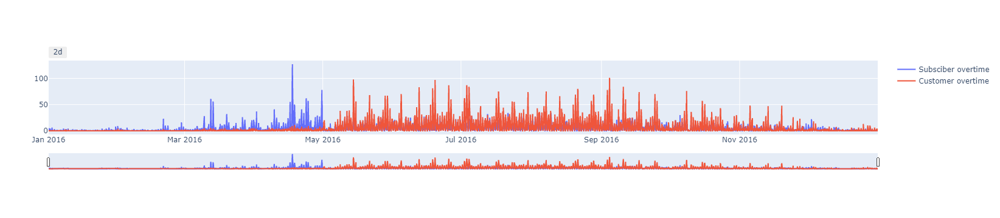

In [131]:
plot = px.Figure()

plot.add_trace(px.Scatter(x=bostonUo["date_time"],
                         y= bostonUo["overtime_s"],
                         name="Subsciber overtime"))
plot.add_trace(px.Scatter(x=bostonUo["date_time"],
                         y= bostonUo["overtime_c"],
                         name="Customer overtime"))

plot.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=2,
                     step="day",
                     stepmode="backward"),
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
    )
)
  
plot.show()

In [132]:
bostonUo.describe()

,hour,overtime_s,overtime_c
count,8548.000000,8548.000000,8548.000000
mean,11.695952,3.761699,5.909803
std,6.882939,6.405687,11.732329
min,0.000000,0.000000,0.000000
25%,6.000000,0.000000,0.000000
50%,12.000000,1.000000,1.000000
75%,18.000000,5.000000,6.000000
max,23.000000,127.000000,101.000000


###
### KPI revenue from over time fees

So the following equation holds:
$$Total Revenue = Membership Fees + Overtime Fees $$

As we do not have any data about active members, we unfortunately cannot calcualte the total revenue. **We instead focus on calculating the additional income generated by the `Overtime Fees`.**

As the dataset is quite huge and the algorithm has to calcualte the fee manually for each trip, it takes up to 5 minutes...

In [133]:
boston["start_time"] = pd.to_datetime(boston["start_time"])
boston["end_time"] = pd.to_datetime(boston["end_time"])
boston["trip_time"] = boston["end_time"] - boston["start_time"]
boston["day"] = boston["start_time"].apply(lambda ts: ts.date())
boston["month"] = boston["start_time"].apply(lambda ts: ts.month)
boston["hour"] = boston["start_time"].apply(lambda ts: ts.hour)
boston.head(5)

,start_time,end_time,start_station_id,end_station_id,start_station_name,end_station_name,bike_id,user_type,trip_time,day,month,hour
0,2016-01-01 00:08:07,2016-01-01 00:40:26,36,19,Boston Public Library - 700 Boylston St.,Buswell St. at Park Dr.,1406,Subscriber,0 days 00:32:19,2016-01-01,1,0
1,2016-01-01 00:08:19,2016-01-01 00:40:27,36,19,Boston Public Library - 700 Boylston St.,Buswell St. at Park Dr.,1121,Subscriber,0 days 00:32:08,2016-01-01,1,0
2,2016-01-01 00:10:15,2016-01-01 00:40:29,36,19,Boston Public Library - 700 Boylston St.,Buswell St. at Park Dr.,474,Subscriber,0 days 00:30:14,2016-01-01,1,0
3,2016-01-01 00:10:22,2016-01-01 00:40:11,36,19,Boston Public Library - 700 Boylston St.,Buswell St. at Park Dr.,1504,Subscriber,0 days 00:29:49,2016-01-01,1,0
4,2016-01-01 00:15:36,2016-01-01 00:31:17,36,67,Boston Public Library - 700 Boylston St.,MIT at Mass Ave / Amherst St,913,Customer,0 days 00:15:41,2016-01-01,1,0


In [134]:
def getAmountOfHalfHour(trip_time):
    anz = trip_time / pd.Timedelta('30min')
    return math.floor(anz) #round down: 1.5 becomes 1 as next full 1/2 hour not reached.

def getOvertimeFeeForTrip(row):
    trip_time = row["trip_time"]
    user_type = row["user_type"]
    
    overtime_fee = 0
    
    if trip_time < pd.Timedelta('30min'):
        overtime_fee = 0
    elif trip_time < pd.Timedelta('60min'):
        overtime_fee = 2
    elif trip_time < pd.Timedelta('90min'):
        overtime_fee = 4
    else:
        overtime_fee = 4
        # every 1/2 hour +8$ are applied
        count = getAmountOfHalfHour(trip_time)
        count = count - 3 #first 90mins are already included by the 4$ above
        overtime_fee += 8*count
        
    #applying 25% discount for members
    if user_type == "Subscriber":
        overtime_fee -= overtime_fee*0.25
    
    return overtime_fee
        
    
boston["overtime_fee"] = boston.apply(getOvertimeFeeForTrip, axis=1) #use axis=1 to pass the series object row-wise
boston.head(5)

,start_time,end_time,start_station_id,end_station_id,start_station_name,end_station_name,bike_id,user_type,trip_time,day,month,hour,overtime_fee
0,2016-01-01 00:08:07,2016-01-01 00:40:26,36,19,Boston Public Library - 700 Boylston St.,Buswell St. at Park Dr.,1406,Subscriber,0 days 00:32:19,2016-01-01,1,0,1.5
1,2016-01-01 00:08:19,2016-01-01 00:40:27,36,19,Boston Public Library - 700 Boylston St.,Buswell St. at Park Dr.,1121,Subscriber,0 days 00:32:08,2016-01-01,1,0,1.5
2,2016-01-01 00:10:15,2016-01-01 00:40:29,36,19,Boston Public Library - 700 Boylston St.,Buswell St. at Park Dr.,474,Subscriber,0 days 00:30:14,2016-01-01,1,0,1.5
3,2016-01-01 00:10:22,2016-01-01 00:40:11,36,19,Boston Public Library - 700 Boylston St.,Buswell St. at Park Dr.,1504,Subscriber,0 days 00:29:49,2016-01-01,1,0,0.0
4,2016-01-01 00:15:36,2016-01-01 00:31:17,36,67,Boston Public Library - 700 Boylston St.,MIT at Mass Ave / Amherst St,913,Customer,0 days 00:15:41,2016-01-01,1,0,0.0


In [135]:
# delete outlier
indexes_to_delete = boston[boston["overtime_fee"] > 300].index
boston.drop(index=indexes_to_delete, inplace=True)

In [136]:
total_revenue_per_day = boston[["day", "overtime_fee"]].groupby("day").sum() # Getting the total revenue per day
total_revenue_per_day.head(5)

,overtime_fee
day,
2016-01-01,781.5
2016-01-02,20.0
2016-01-03,50.5
2016-01-04,46.5
2016-01-05,2.0


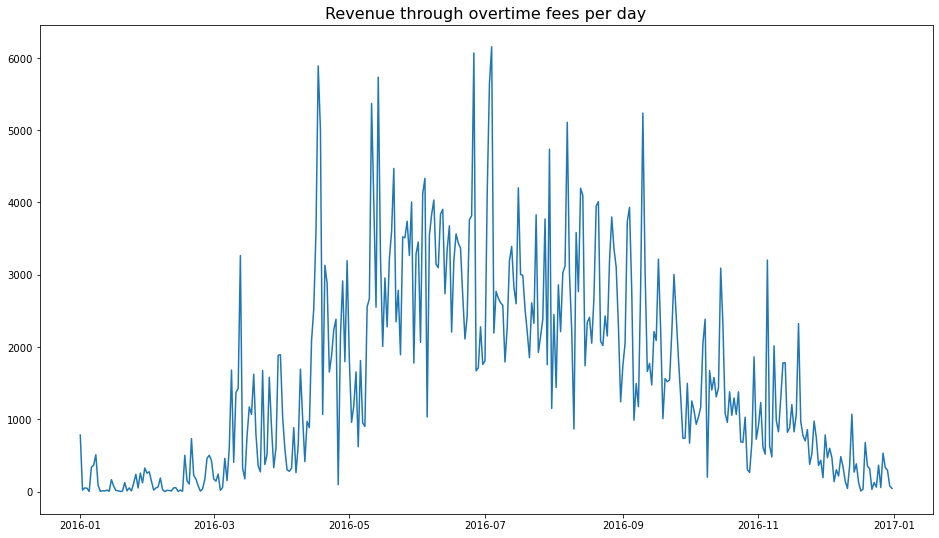

In [137]:
# Plot
fig,ax = plt.subplots(figsize=(16,9)) 

ax.plot(total_revenue_per_day["overtime_fee"])
ax.set_title("Revenue through overtime fees per day",fontsize=16)

plt.show()

We can see a **seasonal trend**: In summer months, people tend to use the bikes longer then in winter months.

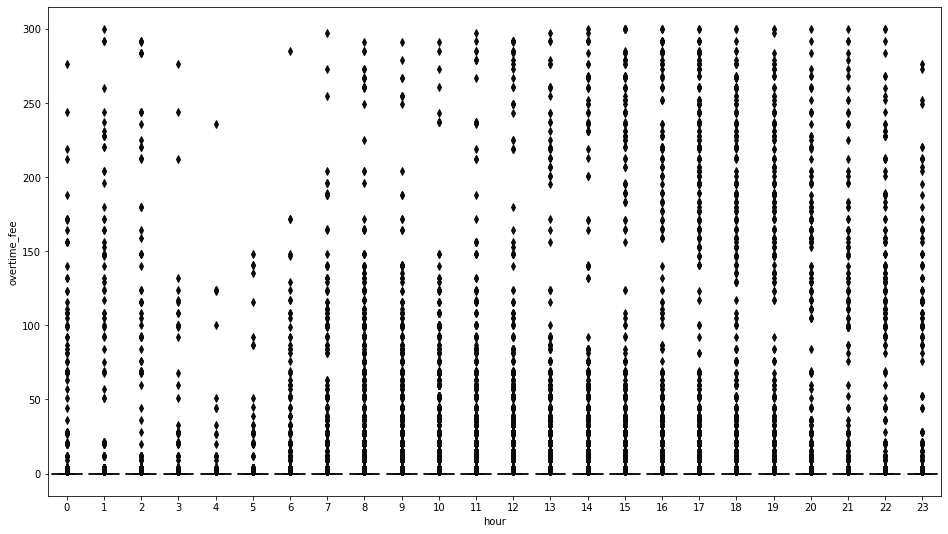

In [138]:
fig,ax = plt.subplots(figsize=(16,9)) 
sns.boxplot(x="hour",y="overtime_fee",data=boston,palette="mako") 
plt.show()

It seems, that most of the time the customer do not overrun their time greatly.

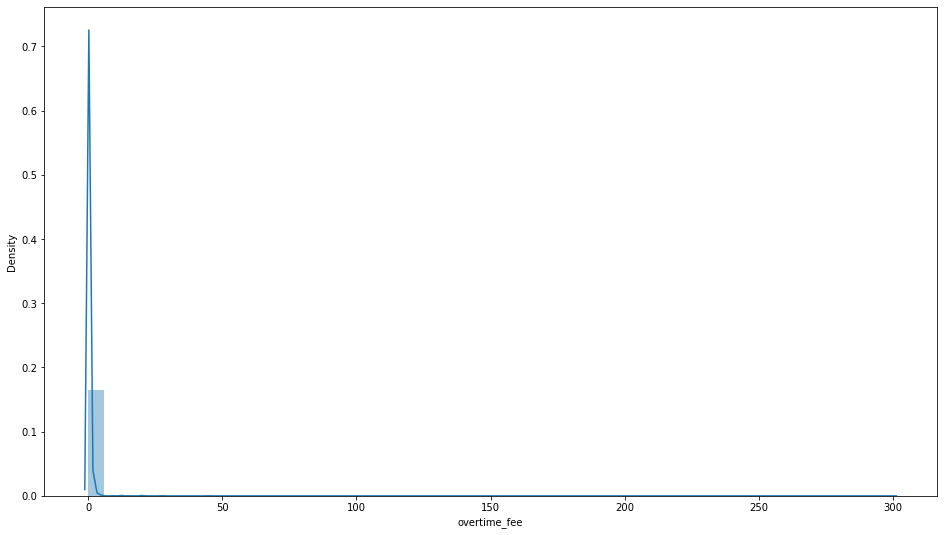

In [139]:
fig,ax = plt.subplots(figsize=(16,9)) 
sns.distplot(boston["overtime_fee"], kde=True)
plt.show()

Yeah, let's remove the outliers for this visualization and only look at the height of fee if any overtime fee was charged.

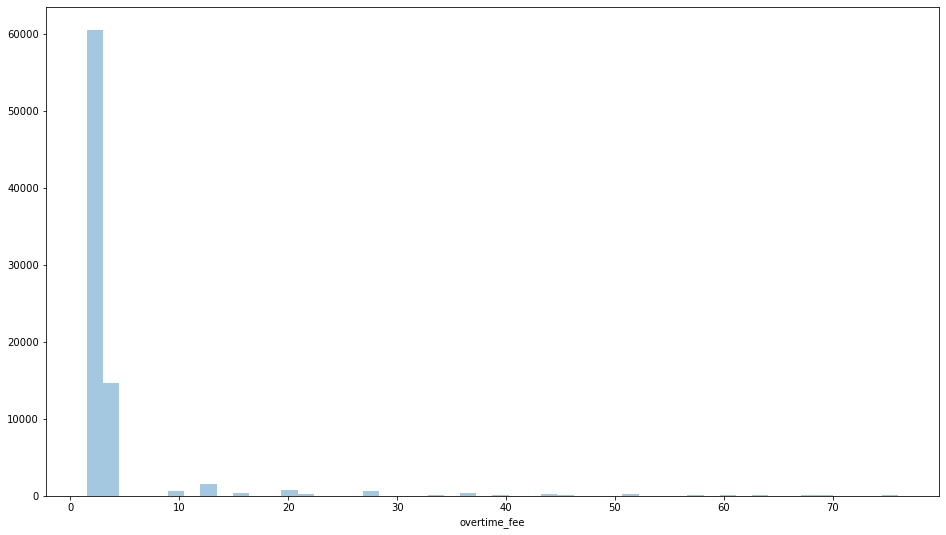

In [140]:
fig,ax = plt.subplots(figsize=(16,9)) 
df = boston[(boston["overtime_fee"] > 0 ) & (boston["overtime_fee"] < 80)]
sns.distplot(df["overtime_fee"], kde=False)
plt.show()

We see, that customers try most of the time to not exceed the inlcuded free 30mins. However, lot's of people exceed 30mins by a short amount of time and thus are charged by 1.5 US-Dollar or 2 US-Dollar (depending on whether they are customer or not). 
Only rarely, the time limit of 30mins gets more greatly.

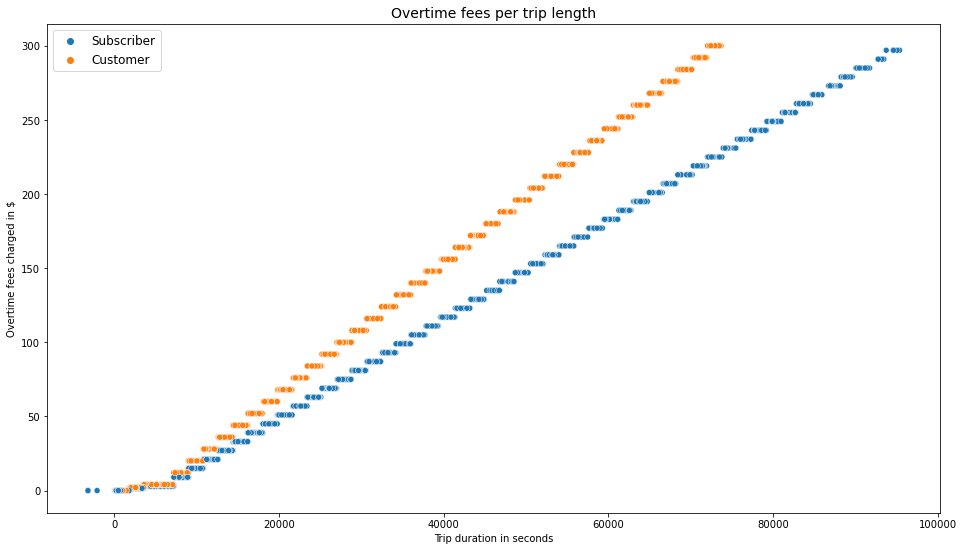

In [141]:
def getTimePassedInSec(datetime):
    return datetime.total_seconds()

fig,ax = plt.subplots(figsize=(16,9)) 

boston_new = boston.copy()
boston_new["trip_time"] = boston_new["trip_time"].apply(lambda x: getTimePassedInSec(x))


sns.scatterplot(ax=ax, x="trip_time", y="overtime_fee", 
                data=boston_new, hue="user_type")

ax.set_xlabel("Trip duration in seconds")
ax.set_ylabel("Overtime fees charged in $")
ax.set_title("Overtime fees per trip length", fontsize=14)
ax.legend(fontsize=12)

plt.show()

## KPI 2: Most Popular Stations

In [142]:
start_ids_per_day_group = boston[["day", "start_station_id", "start_time"]].groupby(["day", "start_station_id"]).count()

In [143]:
end_ids_per_day_group = boston[["day", "end_station_id", "start_time"]].groupby(["day", "end_station_id"]).count()

In [144]:
total_ids_per_day_group = start_ids_per_day_group + end_ids_per_day_group
total_ids_per_day_group.rename(columns={'start_time':'Times this trip appears in dataset'}, inplace=True)
total_ids_per_day_group

Times this trip appears in dataset
day        start_station_id end_station_id                                    
2016-01-01 16               9                                                4
                            19                                               5
                            21                                               2
                            22                                               3
                            25                                               4
...                                                                        ...
2016-12-31 219              190                                              4
                            196                                              2
                            201                                              2
                            213                                              2
                            218                                              3

[7058802 rows x 1 columns]

In [145]:
popular_trips_group = boston.groupby(["start_station_id", "end_station_id"]).size().unstack(level=0)
popular_trips_group.head()
#every NaN means that in whole 2016 there was no trip to it, so replace NaN with zero.

start_station_id,1,3,4,5,6,7,8,9,10,11,...,210,211,212,213,214,215,216,217,218,219
end_station_id,,,,,,,,,,,,,,,,,,,,,
1,14.0,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,140.0,54.0,192.0,28.0,3.0,11.0,37.0,18.0,102.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN
4,NaN,52.0,201.0,36.0,69.0,55.0,4.0,21.0,22.0,38.0,...,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,16.0,NaN
5,NaN,151.0,25.0,420.0,18.0,NaN,81.0,44.0,41.0,119.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,NaN,10.0,68.0,24.0,285.0,57.0,5.0,36.0,36.0,61.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,34.0,NaN


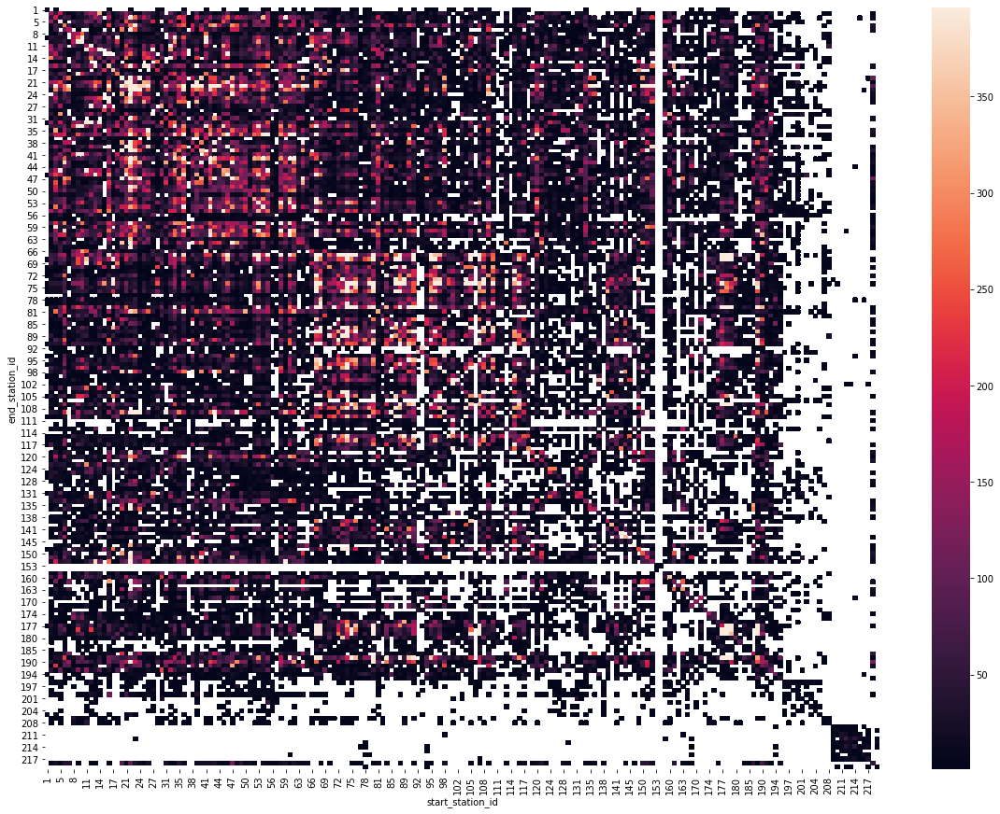

In [146]:
f, axes = plt.subplots(1, 1, figsize=(20, 15))
sns.heatmap(popular_trips_group, robust=True)
plt.show()

#### This heatmap looks a bit unordner, but it conveys quite useful information

1. We see lots of dark point, but also some red points. These red and light points are especially important, as lots of trips start respective end there. That means that BlueBike has to take care that these stations are working correctly (e. g. no technical errors, always enough bikes available, might even add more docker stations for bikes) because otherwise a malfunction could directly lead to customer dissatification.
1. Wee see that in general almost every station is used. That means that we do not have unnecessary stations that only create costs but no profit. However, some white spaces for the stations `211` or `214` could indicate that they are not often used. However, further investigation is needed.
1. Stations `153` and `158` are huge outliners: They are only used by each other which is a quite unusual pattern (see the drawn through white line at the corresponding station IDs). Further investigation reveals that that are the technical 8D OPS stations that are not used publicly.

In [147]:
# Getting the most popular routes (used more than 1000 times)
popular_trips_group = boston.groupby(["start_station_id", "end_station_id"]).size()
popular_trips = pd.DataFrame(popular_trips_group[popular_trips_group > 1000], columns=["count"])
popular_trips.reset_index(inplace=True)
popular_trips.head(5)

,start_station_id,end_station_id,count
0,10,9,1078
1,20,22,1075
2,22,20,1238
3,22,40,1589
4,22,43,1177


In [148]:
# Create normalized dataset
max = popular_trips["count"].max()
min = popular_trips["count"].min()
popular_trips["norm_value"] = popular_trips["count"].apply(lambda x: (x - min) / (max - min) )
popular_trips.head(5)

,start_station_id,end_station_id,count,norm_value
0,10,9,1078,0.026238
1,20,22,1075,0.025129
2,22,20,1238,0.085366
3,22,40,1589,0.215078
4,22,43,1177,0.062823


In [149]:
# helper methods for path visualization
def getNameFromStationId(id):
    df = merged_df[merged_df["start_station_id"]==id]
    name = df.iloc[0]["start_station_name"]
    return name
    
    
def getCoordinatesFromStationId(id):
    df = merged_df[merged_df["start_station_id"]==id]
    
    #as some routes overlap, we use a every small jitter in order to be able to display overlapping lines.
    jitter = random.uniform(-0.0001,+0.0001)
    lat = df.iloc[0]["Latitude_Start"] + jitter
    long = df.iloc[0]["Longitude_Start"] + jitter
    return [lat, long]

In [150]:
ordered_color_dict = col.TABLEAU_COLORS #use pre-defined colors

colors = []
for key, value in ordered_color_dict.items():
   colors.append(value)


map = folium.Map(location=(42.38, -71.1),  tiles='CartoDB positron', zoom_start=13, control_scale=True, max_zoom=20)

# draw trajectory
for index, (start_station_id, end_station_id, count, norm_value) in popular_trips.iterrows():
    if start_station_id != end_station_id:
        coordinates_list = []
        coordinates_list.append(getCoordinatesFromStationId(start_station_id))
        coordinates_list.append(getCoordinatesFromStationId(end_station_id))
        displayMessage = "Trip from station " + getNameFromStationId(start_station_id) + " to station " + getNameFromStationId(end_station_id)
        folium.PolyLine(coordinates_list, color=colors[index%len(colors)], popup=displayMessage, weight=20*norm_value, opacity=0.8).add_to(map)
    else:
        lat = getCoordinatesFromStationId(start_station_id)[0]
        long = getCoordinatesFromStationId(start_station_id)[1]
        folium.CircleMarker(location=(lat, long), popup="Trip started and ended at " + getNameFromStationId(start_station_id), 
                            radius=20*norm_value, opcity=0.8, color=colors[index%len(colors)]).add_to(map)
            
    
#map

We see a map with the most popular trips in 2016. Every trip which was used in 2016 more than 1000 times shown as a line on the map. To get the exact nameing of the start and end station, just click on any line. The more often a trip was used, the more thicker the line is. Colors do not have a special meaning, the are just used to differentiate the trips. Trips that started and ended at the same station, are marked as circle.

**What insights do we obtain?**
1. The most popular trips took place in the inner city. Bikes are escpecially used to travel over the `Massachusetts Ave` bridge.
1. The stations in the inner city are used very often, so the decision of BlueBikes to build lots of stations in the inner city to enable the customers with a more flexible routing in the city was right.
1. Outside the city, there are two places that are used very frequently, too and should be carefully monitored by BlueBikes: At `Davis Square` and `Financial district`.
1. Two stations are **used frequently as start and end point**: `MIT at Mass Ave / Amherst St` and `The Esplanade - Beacon St. at Arlington St.`. Further investigation could determine whether people might miss another returning station and thus, are forced to return back to their start station as every other station would be too far away. This could indicate a potential lack of stations in the bike sharing infrastructure.

It seems that subscribers tend to do longer trips than customers (propably due to the 25% discount the subscribers get)

###
### 3. Predictive Analytics

In [151]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.preprocessing import PolynomialFeatures
from sklearn.model_selection import train_test_split



In [152]:
bostonC.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1235121 entries, 0 to 1235120
Data columns (total 21 columns):
 #   Column              Non-Null Count    Dtype         
---  ------              --------------    -----         
 0   start_time          1235121 non-null  datetime64[ns]
 1   end_time            1235121 non-null  datetime64[ns]
 2   start_station_id    1235121 non-null  int64         
 3   end_station_id      1235121 non-null  int64         
 4   start_station_name  1235121 non-null  object        
 5   end_station_name    1235121 non-null  object        
 6   bike_id             1235121 non-null  int64         
 7   user_type           1235121 non-null  object        
 8   trip_time           1235121 non-null  float64       
 9   trip_id             1235121 non-null  int32         
 10  date                1235121 non-null  datetime64[ns]
 11  month               1235121 non-null  int64         
 12  weekday             1235121 non-null  int64         
 13  hour        

In [153]:
data = pd.merge_asof(bostonC.sort_values("start_time"), weather2016.sort_values("date_time"), on="date", by="hour")

In [154]:
data

,start_time,end_time,start_station_id,end_station_id,start_station_name,end_station_name,bike_id,user_type,trip_time,trip_id,...,season,IsSubscriber,IsCustomer,trip_time_s,overtime_s,overtime_c,date_time,max_temp,min_temp,precip
0,2016-01-01 00:08:07,2016-01-01 00:40:26,36,19,Boston Public Library - 700 Boylston St.,Buswell St. at Park Dr.,1406,Subscriber,1939.0,1,...,1,1,0,1939.0,1939.0,NaN,2016-01-01 00:00:00,5.6,5.6,0.0
1,2016-01-01 00:08:19,2016-01-01 00:40:27,36,19,Boston Public Library - 700 Boylston St.,Buswell St. at Park Dr.,1121,Subscriber,1928.0,2,...,1,1,0,1928.0,1928.0,NaN,2016-01-01 00:00:00,5.6,5.6,0.0
2,2016-01-01 00:10:15,2016-01-01 00:40:29,36,19,Boston Public Library - 700 Boylston St.,Buswell St. at Park Dr.,474,Subscriber,1814.0,3,...,1,1,0,1814.0,1814.0,NaN,2016-01-01 00:00:00,5.6,5.6,0.0
3,2016-01-01 00:10:22,2016-01-01 00:40:11,36,19,Boston Public Library - 700 Boylston St.,Buswell St. at Park Dr.,1504,Subscriber,1789.0,4,...,1,1,0,1789.0,NaN,NaN,2016-01-01 00:00:00,5.6,5.6,0.0
4,2016-01-01 00:15:36,2016-01-01 00:31:17,36,67,Boston Public Library - 700 Boylston St.,MIT at Mass Ave / Amherst St,913,Customer,941.0,5,...,1,0,1,941.0,NaN,NaN,2016-01-01 00:00:00,5.6,5.6,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1235116,2016-12-31 23:01:46,2016-12-31 23:14:20,8,33,Union Square - Brighton Ave at Cambridge St,Kenmore Square,230,Subscriber,754.0,1235117,...,4,1,0,754.0,NaN,NaN,2016-12-31 23:00:00,3.3,3.3,0.0
1235117,2016-12-31 23:14:21,2016-12-31 23:18:03,190,6,Nashua Street at Red Auerbach Way,Cambridge St at Joy St,1420,Subscriber,222.0,1235118,...,4,1,0,222.0,NaN,NaN,2016-12-31 23:00:00,3.3,3.3,0.0
1235118,2016-12-31 23:15:38,2016-12-31 23:24:43,33,36,Kenmore Square,Copley Square - Dartmouth St at Boylston St,230,Subscriber,545.0,1235119,...,4,1,0,545.0,NaN,NaN,2016-12-31 23:00:00,3.3,3.3,0.0
1235119,2016-12-31 23:20:35,2016-12-31 23:27:58,90,141,Lechmere Station at Cambridge St / First St,Kendall Street,74,Subscriber,443.0,1235120,...,4,1,0,443.0,NaN,NaN,2016-12-31 23:00:00,3.3,3.3,0.0


In [155]:
dataA = data.groupby(["date_time", "month", "hour", "weekday", "max_temp", "precip"], as_index=False)["trip_id"].count()
dataA = pd.DataFrame(dataA)

In [156]:
dataA

,date_time,month,hour,weekday,max_temp,precip,trip_id
0,2016-01-01 00:00:00,1,0,4,5.6,0.0,13
1,2016-01-01 01:00:00,1,1,4,5.0,0.0,14
2,2016-01-01 02:00:00,1,2,4,5.0,0.0,9
3,2016-01-01 03:00:00,1,3,4,4.4,0.0,1
4,2016-01-01 06:00:00,1,6,4,3.9,0.0,1
...,...,...,...,...,...,...,...
8543,2016-12-31 19:00:00,12,19,5,1.7,0.0,20
8544,2016-12-31 20:00:00,12,20,5,1.7,0.0,13
8545,2016-12-31 21:00:00,12,21,5,1.7,0.0,22
8546,2016-12-31 22:00:00,12,22,5,2.2,0.0,6


In [157]:
dataA['precip'] = dataA['precip'].apply(lambda x: int(x))

#dataA

In [158]:
dataA["season"] = dataA["month"].apply(lambda x: 1 if 1<=x<=3 else (2 if 4<=x<=6 else (3 if 7<=x<=9 else 4)))
#dataA

In [159]:
dataA["workingday"] = dataA["weekday"].apply(lambda x: 1 if x<=4 else 0)
#dataA

In [160]:
#dataA.corr()

In [161]:
#Create the correlation matrix
#correMtr=dataA[["month", "hour", "weekday", "workingday", "season",  "precip","max_temp" ,"trip_id"]].corr()
#mask=np.array(correMtr)
#mask[np.tril_indices_from(mask)]=False
#Heat map for correlation matrix of attributes
#fig,ax=plt.subplots(figsize=(15,8))
#sns.heatmap(correMtr,mask=mask,vmax=0.8,square=True,annot=True,ax=ax)
#ax.set_title('Correlation matrix of attributes')
#plt.show()

In [162]:


dataA["month"] = dataA.month.astype("category")
dataA["hour"] = dataA.hour.astype("category")
dataA["weekday"] = dataA.weekday.astype("category")
dataA["workingday"] = dataA.workingday.astype("category")
dataA["season"] = dataA.season.astype("category")
dataA["precip"] = dataA.precip.astype("category")
#dataA["user_type"] = dataA.user_type.astype("category")


dataA.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8548 entries, 0 to 8547
Data columns (total 9 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   date_time   8548 non-null   datetime64[ns]
 1   month       8548 non-null   category      
 2   hour        8548 non-null   category      
 3   weekday     8548 non-null   category      
 4   max_temp    8548 non-null   float64       
 5   precip      8548 non-null   category      
 6   trip_id     8548 non-null   int64         
 7   season      8548 non-null   category      
 8   workingday  8548 non-null   category      
dtypes: category(6), datetime64[ns](1), float64(1), int64(1)
memory usage: 319.1 KB


In [163]:
dataA.describe()

,max_temp,trip_id
count,8548.000000,8548.000000
mean,12.029913,144.492396
std,9.752659,167.672471
min,-22.800000,1.000000
25%,4.400000,18.000000
50%,12.200000,71.000000
75%,20.000000,229.000000
max,36.100000,920.000000


In [164]:
#dataA.isnull().sum()

outliers, maybe remove

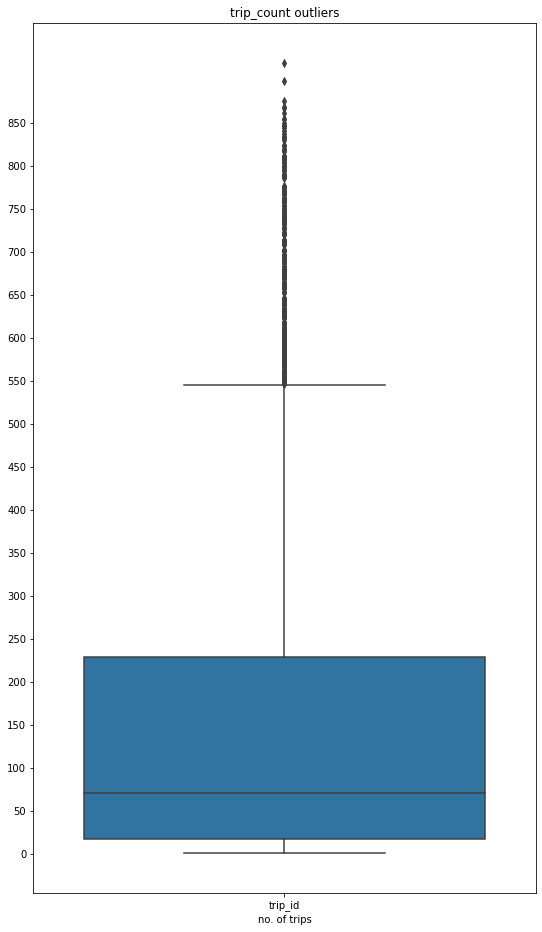

In [254]:
fig,ax=plt.subplots(figsize=(9,16))
#Boxplot for total_count outliers
sns.boxplot(data=dataA[['trip_id']])
ax.set_title('trip_count outliers')
ax.set_yticks(range(0,900,50))
plt.xlabel('no. of trips')
plt.show()

In [166]:
Q1 = dataA.trip_id.quantile(0.25)
Q3 = dataA.trip_id.quantile(0.75)
IQR = Q3 - Q1

In [167]:
### no. of outliers
((dataA.trip_id < (Q1 - 1.5 * IQR)) | (dataA.trip_id > (Q3 + 1.5 * IQR))).sum()

319

In [168]:
dataA.trip_id.count()

8548

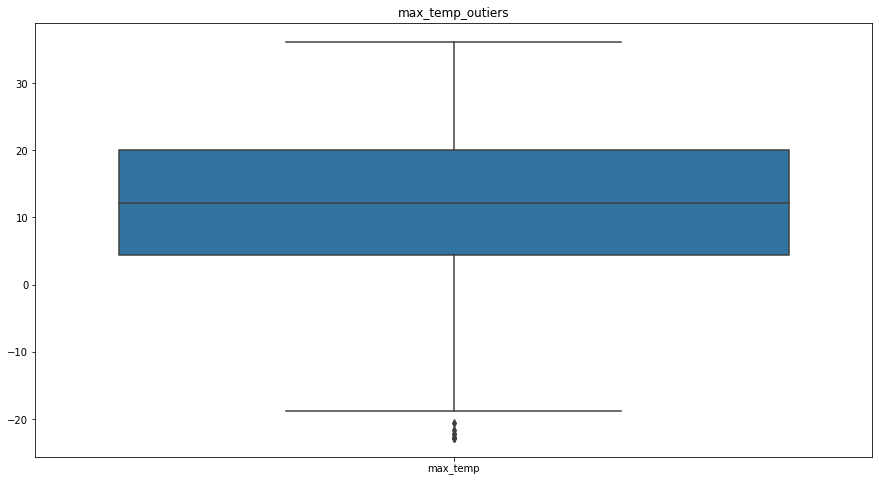

In [169]:
fig,ax=plt.subplots(figsize=(15,8))
#Box plot for Temp_windspeed_humidity_outliers
sns.boxplot(data=dataA[['max_temp']])
ax.set_title('max_temp_outiers')
plt.show()

In [170]:
Q1 = dataA.max_temp.quantile(0.25)
Q3 = dataA.max_temp.quantile(0.75)
IQR = Q3 - Q1

In [171]:
### no. of outliers
((dataA.max_temp < (Q1 - 1.5 * IQR)) | (dataA.max_temp > (Q3 + 1.5 * IQR))).sum()

8

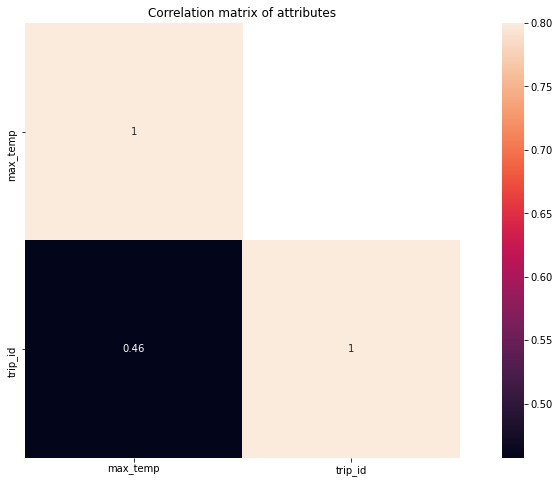

In [172]:
#Create the correlation matrix
correMtr=dataA[["month", "hour", "weekday", "workingday", "season",  "precip","max_temp" ,"trip_id"]].corr()
mask=np.array(correMtr)
mask[np.tril_indices_from(mask)]=False
#Heat map for correlation matrix of attributes
fig,ax=plt.subplots(figsize=(15,8))
sns.heatmap(correMtr,mask=mask,vmax=0.8,square=True,annot=True,ax=ax)
ax.set_title('Correlation matrix of attributes')
plt.show()

###
### Features

In [173]:
#categorical attributes
cat_attributes=["month", "hour", "weekday", "workingday", "season",  "precip"]

#numerical attributes
num_attributes=["max_temp" ]


In [174]:
attributes = dataA[["month", "hour", "weekday", "workingday", "season",  "precip", "max_temp" ]]

y = dataA["trip_id"]

In [175]:
X = pd.get_dummies(attributes,columns=cat_attributes)
#X

In [176]:
#stop execution 
    
#raise SystemExit("Stop right there!")

###
### Linear Regression
### used for testing


test train split for features

In [177]:
# Do a 70-30 split first
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3,random_state=34 )

# now split X_train to achive 50-20-30 split
#X_train, X_hold, y_train, y_hold = train_test_split(X_train, y_train, test_size=(0.2/0.7),random_state=34 )

In [178]:
#print(len(X_train),len(X_hold),len(X_test))

In [179]:
lr2 = LinearRegression()
lr2.fit(X_train, y_train)
#print(lr2.coef_, lr2.intercept_)

LinearRegression()

In [180]:
#coeff_df = pd.DataFrame(lr2.coef_, X.columns, columns=['Coefficient'])
#coeff_df

In [181]:
lr = lr2.score(X_train, y_train)
lr

0.6745052948055528

In [182]:
y_pred = lr2.predict(X_test)

In [183]:
df = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred})
df

,Actual,Predicted
2062,38,85.880859
7738,45,57.482422
8051,87,32.361328
5454,192,233.710938
5980,209,182.247070
...,...,...
8526,5,-81.839844
8466,78,135.248047
4832,210,256.927734
2026,46,58.695312


In [184]:
print('Mean Absolute Error:', mean_absolute_error(y_test, y_pred))
#print('Mean Squared Error:', mean_squared_error(y_test, y_pred))
print('Root Mean Squared Error:', np.sqrt(mean_squared_error(y_test, y_pred)))
print("R2 Score:", r2_score(y_test,y_pred))

Mean Absolute Error: 71.20631967288011
Root Mean Squared Error: 94.5552969229903
R2 Score: 0.6686636054201739


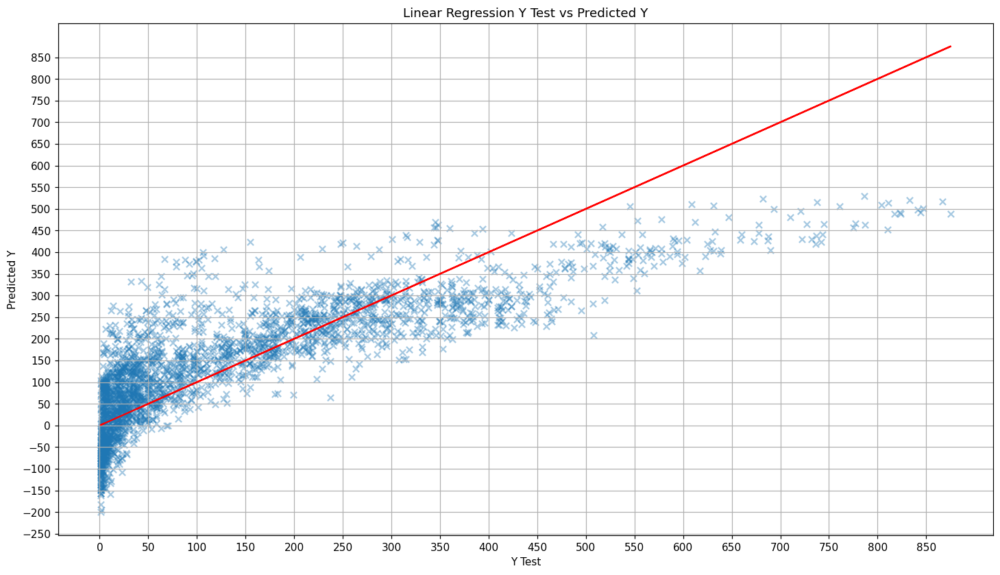

In [185]:
fig,ax = plt.subplots(figsize=(16,9), dpi=110) 
plt.scatter(x = y_test, y = y_pred, marker ="x", alpha=0.4)
plt.plot(y_test, y_test, c="r")
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
ax.set_yticks(range(-250,900,50))
ax.set_xticks(range(0,900,50))
plt.title("Linear Regression Y Test vs Predicted Y")

plt.grid()
plt.show()

In [187]:
#stop execution 
    
#raise SystemExit("Stop right there!")

### Linear Regression with polynomial features
### we tried to do a grid search for the polynomial degrees, but we couldn´t get it to work properly with degrees greater than 2
### so we tested them manually and noticed that a degree 2 perfomed best and with a degree of 3 we got strange error values

In [188]:
# initialize model
Poly2 = PolynomialFeatures(degree = 2)
#Poly2 = PolynomialFeatures(degree = 3)

# fit and transform xp
X_poly2 = Poly2.fit_transform(X)

In [189]:
# Do a 70-30 split first
X_train3, X_test3, y_train3, y_test3 = train_test_split(X_poly2, y, test_size=0.3,random_state=34 )

In [190]:
# initialize and fit model
lin_mod_poly = LinearRegression()
lin_mod_poly.fit(X_train3,y_train3)

LinearRegression()

In [191]:
lnp = lin_mod_poly.score(X_train3, y_train3)
lnp

0.9047094347192726

In [192]:
y_pred3= lin_mod_poly.predict(X_test3)

In [193]:
df = pd.DataFrame({'Actual': y_test3, 'Predicted': y_pred3})
df

,Actual,Predicted
2062,38,158.356190
7738,45,63.788837
8051,87,93.754047
5454,192,232.214985
5980,209,144.751362
...,...,...
8526,5,21.092648
8466,78,74.918739
4832,210,222.615986
2026,46,57.424458


In [194]:
print('Mean Absolute Error:', mean_absolute_error(y_test3, y_pred3))
#print('Mean Squared Error:', mean_squared_error(y_test3, y_pred3))
print('Root Mean Squared Error:', np.sqrt(mean_squared_error(y_test3, y_pred3)))
print("R2 Score:", r2_score(y_test3,y_pred3))

Mean Absolute Error: 39.191482073986506
Root Mean Squared Error: 57.72063483305294
R2 Score: 0.8765305212595419


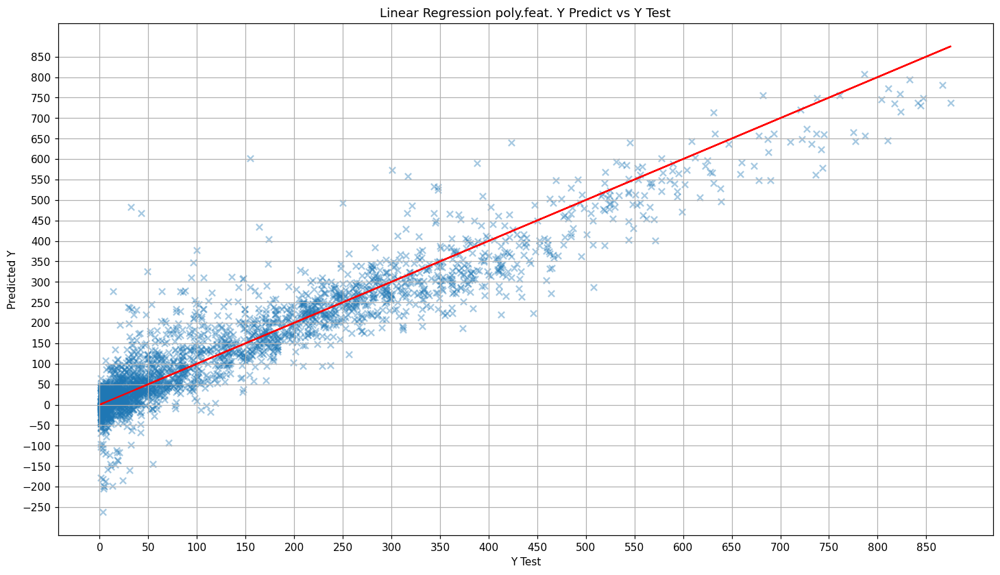

In [195]:
fig,ax = plt.subplots(figsize=(16,9), dpi=110) 
plt.scatter(x = y_test3, y = y_pred3, marker ="x", alpha=0.4)
plt.plot(y_test3, y_test3, c="r")
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
ax.set_yticks(range(-250,900,50))
ax.set_xticks(range(0,900,50))
plt.title("Linear Regression poly.feat. Y Predict vs Y Test")

plt.grid()
plt.show()

###
### Ridge Regression

In [197]:
from sklearn.linear_model import Ridge

### polynomial features

In [198]:
# initialize model
Poly = PolynomialFeatures(degree = 2)

# fit and transform xp
X_poly = Poly.fit_transform(X)

In [199]:
len(X_poly)

8548

### test train split for poylnomial features

In [200]:
# Do a 70-30 split first
X_train2, X_test2, y_train2, y_test2 = train_test_split(X_poly, y, test_size=0.3,random_state=34 )

# now split X_train to achive 50-20-30 split
#X_train2, X_hold2, y_train2, y_hold2 = train_test_split(X_train2, y_train2, test_size=(0.2/0.7),random_state=34 )

In [201]:
#print(len(X_train2),len(X_hold2),len(X_test2))

In [202]:
print(len(X_train2),len(X_test2))

5983 2565


### Ridge Regression

In [203]:
model_L2 = Ridge(alpha = 0.1, normalize = True, solver = 'lsqr') # select least squares regression as solver

model_L2.fit(X_train2, y_train2)


#print("Coefficients ", model_L2.coef_, "\nIntercept ", model_L2.intercept_ )

Ridge(alpha=0.1, normalize=True, solver='lsqr')

In [204]:
rid = model_L2.score(X_train2, y_train2)
rid

0.9019850459446936

In [205]:
y_pred2= model_L2.predict(X_test2)

In [206]:
df = pd.DataFrame({'Actual': y_test2, 'Predicted': y_pred2})
df

,Actual,Predicted
2062,38,156.269295
7738,45,68.643802
8051,87,86.978517
5454,192,224.073183
5980,209,144.900800
...,...,...
8526,5,15.328529
8466,78,80.440619
4832,210,229.598208
2026,46,57.698383


In [207]:

print("Validation:")
print('Mean Absolute Error:', mean_absolute_error(y_test2, y_pred2))
#print('Mean Squared Error:', mean_squared_error(y_test2, y_pred2))
print('Root Mean Squared Error:', np.sqrt(mean_squared_error(y_test2, y_pred2)))
print("R2 Score:", r2_score(y_test2,y_pred2))

Validation:
Mean Absolute Error: 38.97219034513882
Root Mean Squared Error: 57.800503103104134
R2 Score: 0.8761885944510397


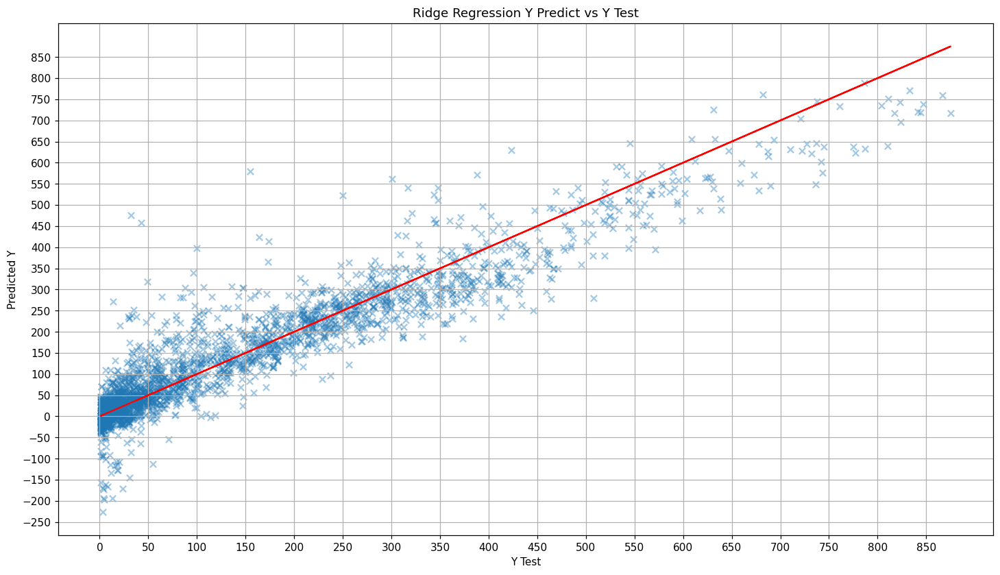

In [208]:
fig,ax = plt.subplots(figsize=(16,9), dpi=110) 
plt.scatter(x = y_test2, y = y_pred2, marker ="x", alpha=0.4)
plt.plot(y_test2, y_test2, c="r")
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
ax.set_yticks(range(-250,900,50))
ax.set_xticks(range(0,900,50))
plt.title("Ridge Regression Y Predict vs Y Test")

plt.grid()
plt.show()

In [210]:
def plot_L2_regression_performance (x, y, deg):

    err_train = []
    err_cv = []
    
    x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.3,random_state=10)

    for alpha in np.logspace(-8,3,100):

        # create poly features
        poly_reg = PolynomialFeatures (degree = deg)
        X_train_poly = poly_reg.fit_transform(x_train)
        X_test_poly = poly_reg.fit_transform(x_test)

        # fit model
        model_L2 = Ridge(alpha = alpha, normalize = True, solver = 'lsqr') # select least squares regression as solver
        model_L2.fit(X_train_poly, y_train)
    
        # compute errors
        err_train.append(mean_squared_error(model_L2.predict(X_train_poly), y_train))
        err_cv.append(mean_squared_error(model_L2.predict(X_test_poly), y_test))


    plt.figure(figsize = (8,6))
    plt.loglog(np.logspace(-8,3,100), err_train, np.logspace(-8,3,100), err_cv)
    plt.legend(["Training", "Validation"])
    plt.xlabel("$\lambda$ (or alpha in scikit learn terms)")
    plt.ylabel("Mean squared error")
    plt.show()

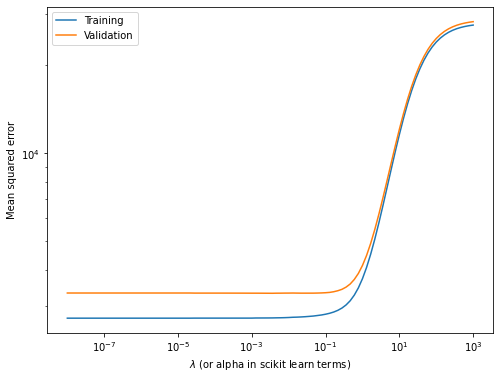

In [211]:
plot_L2_regression_performance(X,y,2)

### Lasso Regression

In [212]:
from sklearn.linear_model import Lasso

In [213]:
model_L1 = Lasso(alpha = 0.01, normalize = True)

model_L1.fit(X_train2, y_train2)


#print("Coefficients ", model_L2.coef_, "\nIntercept ", model_L2.intercept_ )

Lasso(alpha=0.01, normalize=True)

In [214]:
las = model_L1.score(X_train2, y_train2)
las

0.8948658117308785

In [215]:
y_pred2= model_L1.predict(X_test2)

In [216]:
df = pd.DataFrame({'Actual': y_test2, 'Predicted': y_pred2})
df

,Actual,Predicted
2062,38,147.489134
7738,45,78.351447
8051,87,87.019652
5454,192,215.407086
5980,209,151.433735
...,...,...
8526,5,13.574018
8466,78,92.343778
4832,210,229.843731
2026,46,43.314941


In [217]:

print('Mean Absolute Error:', mean_absolute_error(y_test2, y_pred2))
#print('Mean Squared Error:', mean_squared_error(y_test2, y_pred2))
print('Root Mean Squared Error:', np.sqrt(mean_squared_error(y_test2, y_pred2)))
print("R2 Score:", r2_score(y_test2,y_pred2))

Mean Absolute Error: 40.151735928259356
Root Mean Squared Error: 58.646321102865635
R2 Score: 0.8725385177675956


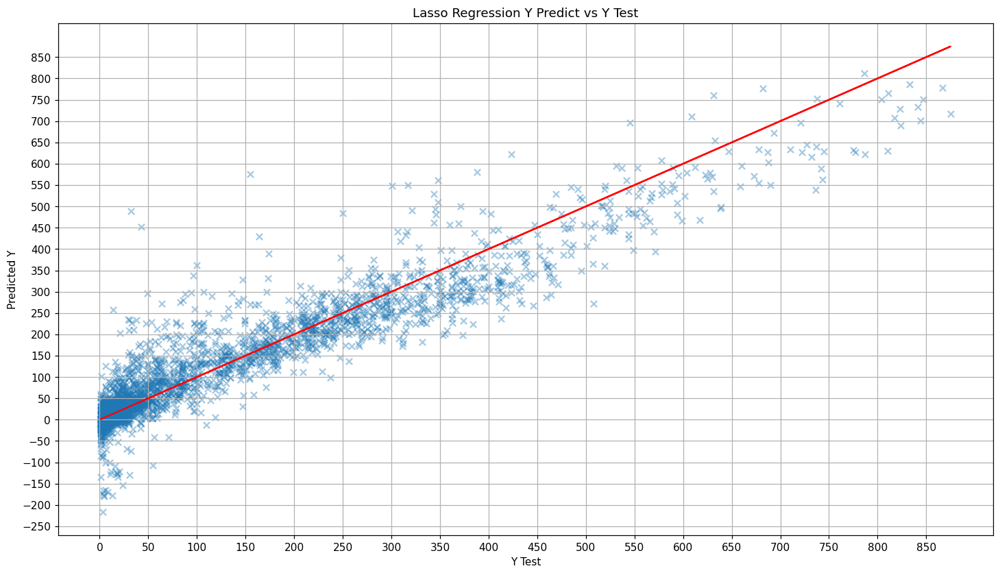

In [220]:
fig,ax = plt.subplots(figsize=(16,9), dpi=110) 
plt.scatter(x = y_test2, y = y_pred2, marker ="x", alpha=0.4)
plt.plot(y_test2, y_test2, c="r")
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
ax.set_yticks(range(-250,900,50))
ax.set_xticks(range(0,900,50))
plt.title("Lasso Regression Y Predict vs Y Test")

plt.grid()
plt.show()

In [221]:
#stop execution 
    
#raise SystemExit("Stop right there!")

In [222]:
def plot_L1_regression_performance (x, y, deg):
    
    err_train = []
    err_cv = []
    
    #split data
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3,random_state=10)
    
    # loop over alpha, compute train and test scores and append to err_train and err_cv
    
    for alpha in np.logspace(-8,3,100):
        
        # create poly features
        poly_reg = PolynomialFeatures (degree = deg)
        X_train_poly = poly_reg.fit_transform(x_train)
        X_test_poly = poly_reg.fit_transform(x_test)

        # fit model
        model_L1 = Lasso(alpha = alpha, normalize = True)
        model_L1.fit(X_train_poly, y_train)
    
        # compute errors
        err_train.append(mean_squared_error(model_L1.predict(X_train_poly), y_train))
        err_cv.append(mean_squared_error(model_L1.predict(X_test_poly), y_test))

    # plot the results
    
    plt.figure(figsize = (8,6))
    plt.loglog(np.logspace(-8,3,100), err_train, np.logspace(-8,3,100), err_cv)
    plt.legend(["Training", "Validation"])
    plt.xlabel("$\lambda$ (or alpha in scikit learn terms)")
    plt.ylabel("Mean squared error")
    plt.show()

the plot below is out commented due to its long execution time

In [223]:
#plot_L1_regression_performance (X, y, 2)

### KNN Regression, not used in report, just for experimentation

In [224]:
from sklearn.neighbors import KNeighborsRegressor

In [225]:
from sklearn.preprocessing import MinMaxScaler, StandardScaler

scaler = MinMaxScaler()
X_train['max_temp'] = scaler.fit_transform(X_train['max_temp'].values.reshape(-1,1))
X_test['max_temp'] = scaler.fit_transform(X_test['max_temp'].values.reshape(-1,1))

In [226]:

#Fit model
KNN_reg = KNeighborsRegressor()
KNN_model = KNN_reg.fit(X_train, y_train)


#print("Coefficients ", model_L2.coef_, "\nIntercept ", model_L2.intercept_ )

In [227]:
knn = KNN_model.score(X_train, y_train)
knn

0.8306216733853253

In [228]:

y_pred = KNN_model.predict(X_test)

In [229]:
df = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred})
df

,Actual,Predicted
2062,38,138.8
7738,45,112.8
8051,87,60.2
5454,192,236.2
5980,209,239.8
...,...,...
8526,5,19.0
8466,78,65.4
4832,210,296.8
2026,46,115.4


In [230]:
print('Mean Absolute Error:', mean_absolute_error(y_test, y_pred))
print('Mean Squared Error:', mean_squared_error(y_test, y_pred))
print('Root Mean Squared Error:', np.sqrt(mean_squared_error(y_test, y_pred)))
print("R2 Score:", r2_score(y_test,y_pred))

Mean Absolute Error: 61.614113060428856
Mean Squared Error: 8336.271204678364
Root Mean Squared Error: 91.30318288361235
R2 Score: 0.691063478808299


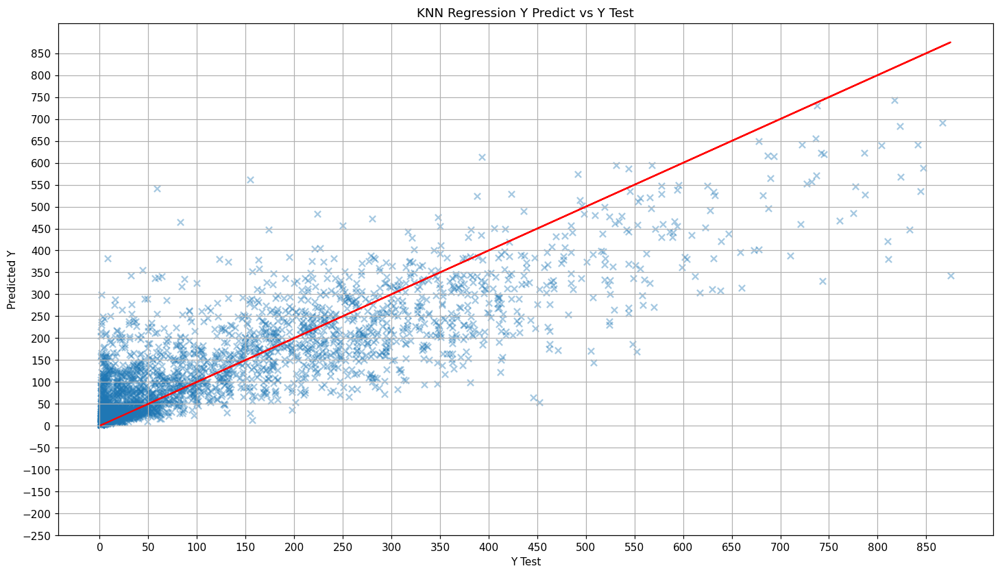

In [231]:
fig,ax = plt.subplots(figsize=(16,9), dpi=110) 
plt.scatter(x = y_test, y = y_pred, marker ="x", alpha=0.4)
plt.plot(y_test, y_test, c="r")
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
ax.set_yticks(range(-250,900,50))
ax.set_xticks(range(0,900,50))
plt.title("KNN Regression Y Predict vs Y Test")

plt.grid()
plt.show()

In [233]:
def find_knn (x,y,max_k):
    
    err_train = [] 
    err_test = []
    
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3,random_state=10)

    for n in np.arange(1,max_k):

        # fit model
        KNN_reg = KNeighborsRegressor(n_neighbors=n)
        KNN_model = KNN_reg.fit(x_train, y_train)


        # compute errors
        err_train.append(mean_absolute_error(KNN_model.predict(x_train), y_train))
        err_test.append(mean_absolute_error(KNN_model.predict(x_test), y_test))
        
    plt.figure(figsize = (8,6))
    plt.plot(np.arange(1,max_k), err_train,np.arange(1,max_k), err_test)
    plt.legend(["Training", "Validation"])
    plt.xlabel("Number of neighbors")
    plt.ylabel("MAE")
    #plt.ylim((0,1))
    plt.show()

In [234]:
#find_knn (X,y,max_k=50)

### Tree Based Regression

In [235]:
from sklearn.tree import DecisionTreeRegressor

In [236]:

Tree_reg = DecisionTreeRegressor(max_depth=30,criterion="mse")
tree_model = Tree_reg.fit(X_train, y_train)


#print("Coefficients ", model_L2.coef_, "\nIntercept ", model_L2.intercept_ )

In [237]:
tre = tree_model.score(X_train, y_train)
tre

0.9972048174547208

In [238]:

y_pred = tree_model.predict(X_test)

In [239]:
df = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred})
df

,Actual,Predicted
2062,38,114.0
7738,45,45.0
8051,87,35.0
5454,192,222.0
5980,209,145.0
...,...,...
8526,5,4.0
8466,78,34.0
4832,210,146.0
2026,46,63.0


In [240]:
print('Mean Absolute Error:', mean_absolute_error(y_test, y_pred))
#print('Mean Squared Error:', mean_squared_error(y_test, y_pred))
print('Root Mean Squared Error:', np.sqrt(mean_squared_error(y_test, y_pred)))
print("R2 Score:", r2_score(y_test,y_pred))

Mean Absolute Error: 41.75616577095479
Root Mean Squared Error: 75.44838691938904
R2 Score: 0.7890413513761637


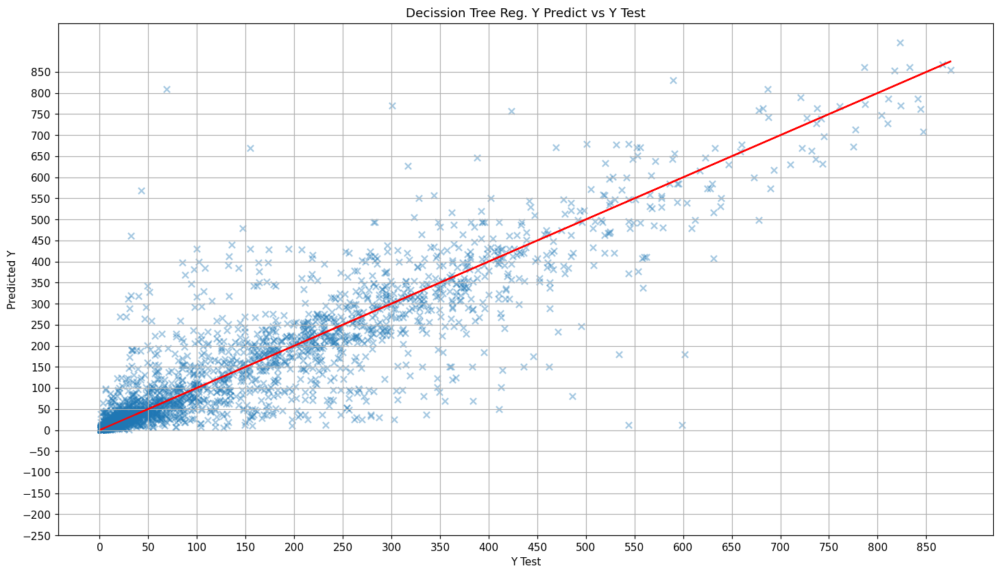

In [243]:
fig,ax = plt.subplots(figsize=(16,9), dpi=110) 
plt.scatter(x = y_test, y = y_pred, marker ="x", alpha=0.4)
plt.plot(y_test, y_test, c="r")
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
ax.set_yticks(range(-250,900,50))
ax.set_xticks(range(0,900,50))
plt.title("Decission Tree Reg. Y Predict vs Y Test")

plt.grid()
plt.show()

In [244]:
def find_tree_depth (x,y):
    
    # define list for collecting results
    err_train = [] 
    err_test = []
    
    # split data
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3,random_state=10)
    
    #loop over max_depth
    
    for n in np.arange(1,51): # lets test until 24 for now
        
        # fit model
        
        tree_reg = DecisionTreeRegressor(max_depth=n)
        tree_model = tree_reg.fit(x_train,y_train)
        
        # compute errors
        
        err_train.append(mean_absolute_error(y_train, tree_model.predict(x_train)))
        err_test.append(mean_absolute_error(y_test, tree_model.predict(x_test)))


    plt.figure(figsize = (8,6))
    plt.plot(np.arange(1,51), err_train,np.arange(1,51), err_test)
    plt.legend(["Training", "Validation"])
    plt.xlabel("Max Tree Depth")
    plt.ylabel("MAE")
    plt.title("Search over max_depth parameter",fontsize=14)
    #plt.ylim((0,1))
    plt.show()


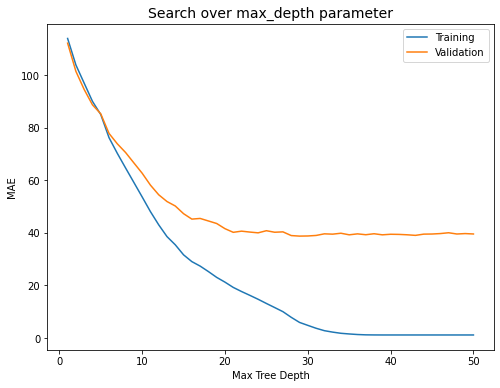

In [245]:
find_tree_depth (X,y)

In [246]:
from sklearn.tree import DecisionTreeRegressor, export_graphviz
import graphviz

def plot_regression_tree_sklearn(tree_depth):

    # Fit regression model (to full data)
    model = DecisionTreeRegressor(max_depth=tree_depth)
    model.fit(X, y) 
    
    dot_data = export_graphviz(model)  
    
    graph = graphviz.Source(dot_data) 
    
    return graph

### due to its large size, the regression tree plot is out commented

In [247]:
#plot_regression_tree_sklearn(20)